# 4 Geocentric Models

- **Linear Regression** is meant to be a family of simple statistical golems that attempt to learn about the mean and variance of some measurement, using an additive combination of other measurements.
- Introduced is linear regression as a Bayesian procedure.
- Under a probability interpretation, which is necessary for Bayesian work, linear regression uses a Gaussian distribution to describe our golem's uncertainty about some measurement of interest.
- This type of model is simple, flexible, and commonplace. Like all statistical models, it is not universally useful. But ..
- linear regression has a strong claim to being foundational, in the sense that once you learn to build and interpret linear regression models, you can more easily move on to other type of regression which are less normal.

In [1]:
import arviz as az
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
import pandas as pd
import pymc3 as pm
import scipy.stats as stats

from scipy.interpolate import griddata

In [2]:
%config InlineBackend.figure_format = 'retina'
az.style.use('arviz-darkgrid')
%load_ext watermark
az.rcParams["stats.hdi_prob"] = 0.89  # sets default credible interval used by arviz

## 4.1. Why normal distributions are normal

### 4.1.1. Normal by addition

#### Simulation of field trip

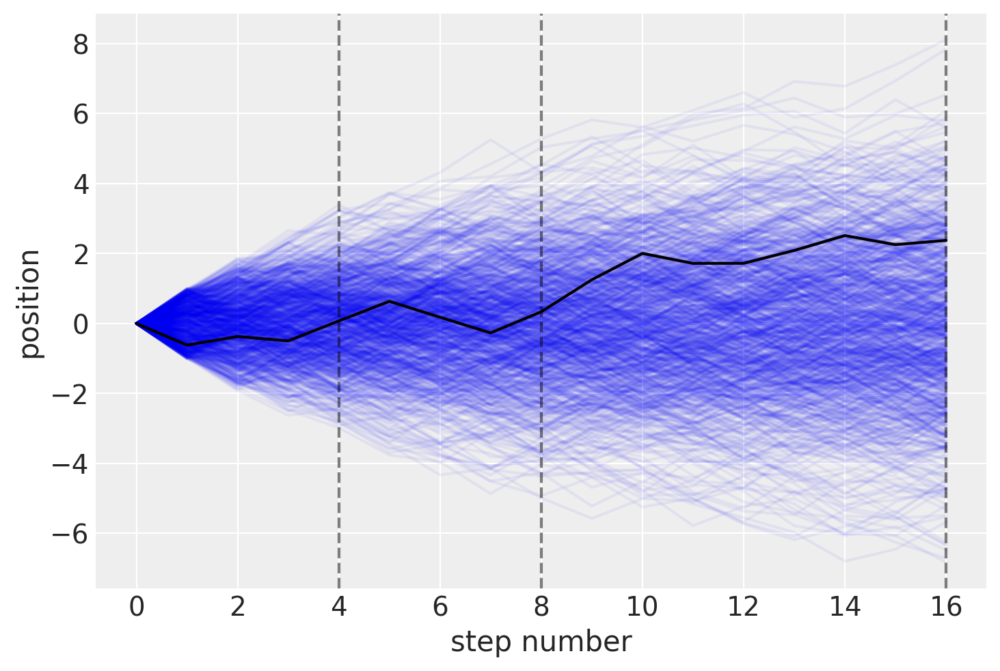

In [3]:
np.random.seed(1234)
steps = 16 + 1 # since 0-th step is fixed at 0
repetitions = 1000
x = np.zeros([steps, repetitions])
for i in range(x.shape[1]):
    x[1:, i] = np.cumsum(np.random.uniform(-1, 1, steps - 1))

plt.plot(x[:, :], c="b", alpha=0.05);
plt.plot(x[:, 0], c="k")
plt.axvline(4, linestyle="--", c="k", alpha=0.5)
plt.axvline(8, linestyle="--", c="k", alpha=0.5)
plt.axvline(16, linestyle="--", c="k", alpha=0.5)
plt.xlabel("step number")
plt.ylabel("position")
plt.show()

-0.49925774986205074


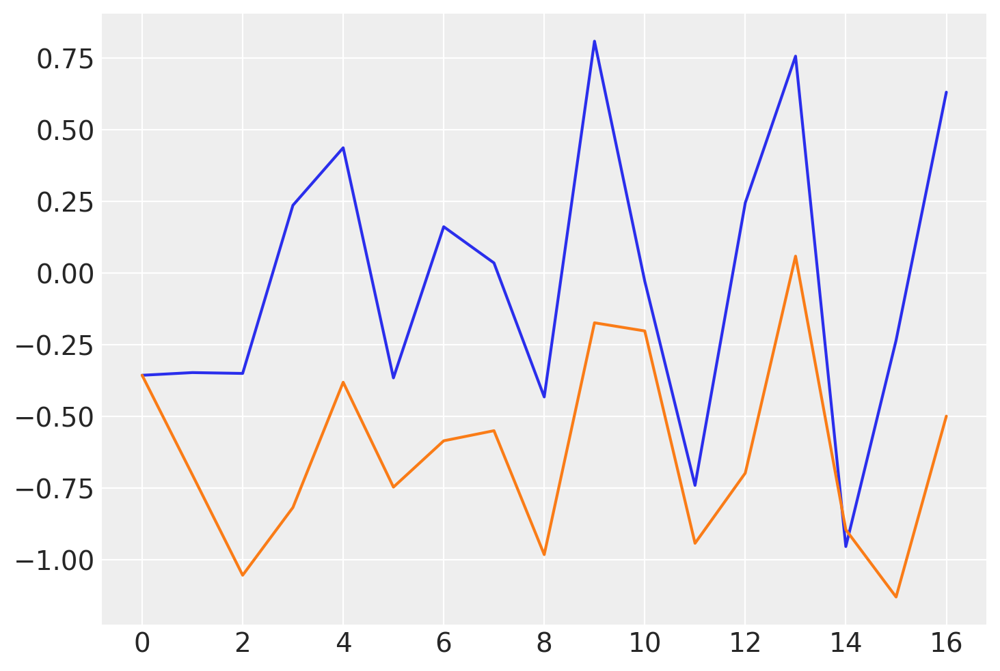

In [4]:
a = np.random.uniform(-1,1,steps)
b = np.cumsum(a)
plt.plot(a)
plt.plot(b)
print(sum(a))

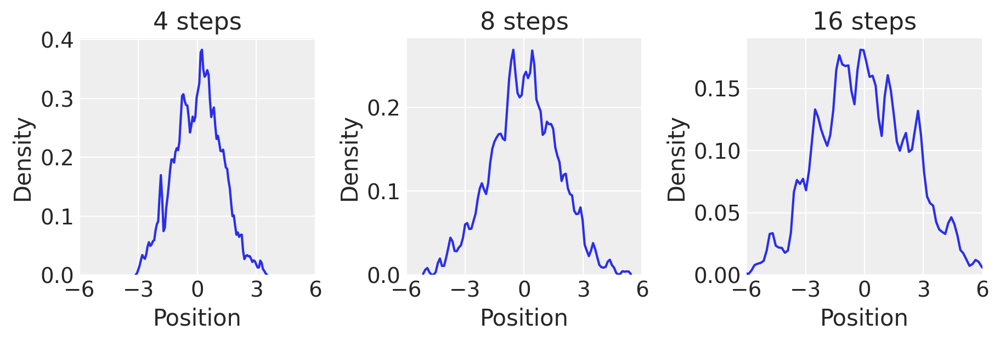

In [5]:
fig, ax = plt.subplots(1, 3, figsize=(9, 3), sharex=True)
sns.distplot(x[4, :], kde_kws={"bw": 0.051}, ax=ax[0], hist=False)
sns.distplot(x[8, :], kde_kws={"bw": 0.051}, ax=ax[1], hist=False)
sns.distplot(x[16, :], kde_kws={"bw": 0.051}, ax=ax[2], hist=False)

ax[0].set_title("4 steps")
ax[1].set_title("8 steps")
ax[2].set_title("16 steps")

for i in range(3):
    ax[i].set_ylabel("Density")
    ax[i].set_xlabel("Position")
    ax[i].set_xlim(-6, 6)
    ax[i].set_xticks([-6, -3, 0, 3, 6])

#### Code 4.1

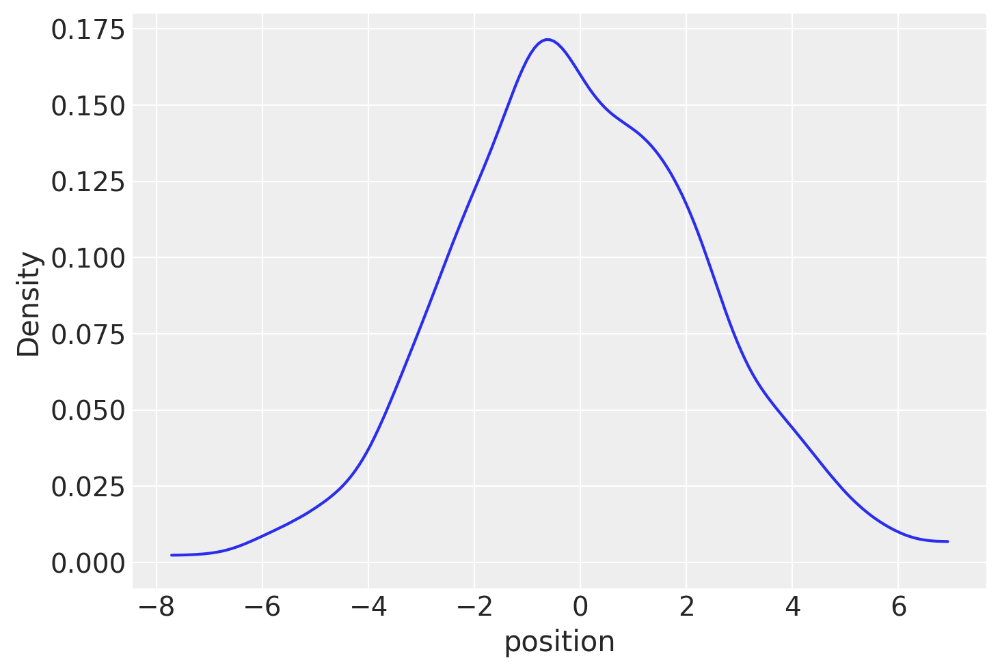

In [6]:
pos = np.random.uniform(-1, 1, size=(16, 1000)).sum(0)  # make 1000 data, each of which is the sum of 16 r.n.'s from uniform(-1,1)
az.plot_kde(pos)
plt.xlabel("position")
plt.ylabel("Density");

- increase the number of samples from 1000 to 10000 or more, the shape will more look like Gaussian

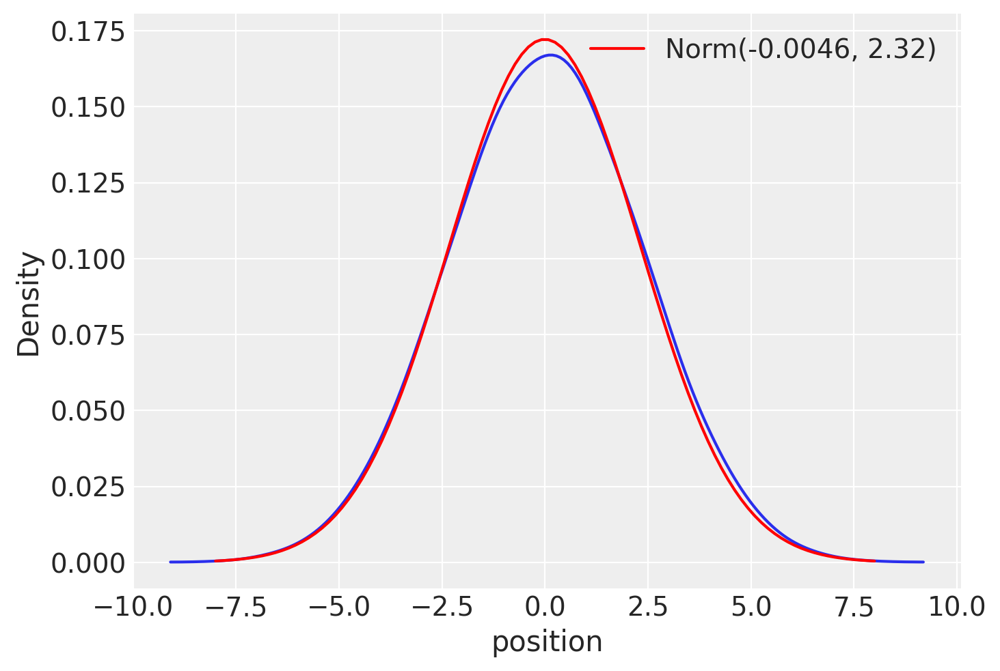

In [7]:
n = 100000
pos = np.random.uniform(-1, 1, size=(16, n)).sum(0)  # make 1000 data, each of which is the sum of 16 r.n.'s from uniform(-1,1)
az.plot_kde(pos)
plt.xlabel("position")
plt.ylabel("Density");
m, s = pos.mean(), pos.std()
m, s
x = np.linspace(-8, 8, 100)
plt.plot(x, stats.norm(loc=m, scale=s).pdf(x), 'r-', label=f'Norm({m:.2}, {s:.3})');
plt.legend();

[Uniform Distribution Theory](https://en.wikipedia.org/wiki/Uniform_distribution_(continuous))

Theoretically, X ~ Uniform(a,b) has
$$
    \mu = (b-a)/2, \quad Var = (b-a)^2/12
$$
We have sum of 16 independent X's:
$$
Var(Y) = Var(\sum_{i=1}^{16} X) = \sum_i Var(X)   = 16 Var(X) = 16 * (1-(-1))^2 / 12 = 16 * 4 / 12 = 16/3
$$

In [8]:
std_X16 = np.sqrt(16/3)
print('Theoretical std of X+X+...+X 16 times is', std_X16)

Theoretical std of X+X+...+X 16 times is 2.309401076758503


### 4.1.2 Normal by Multiplication

#### Code 4.2 and 4.3

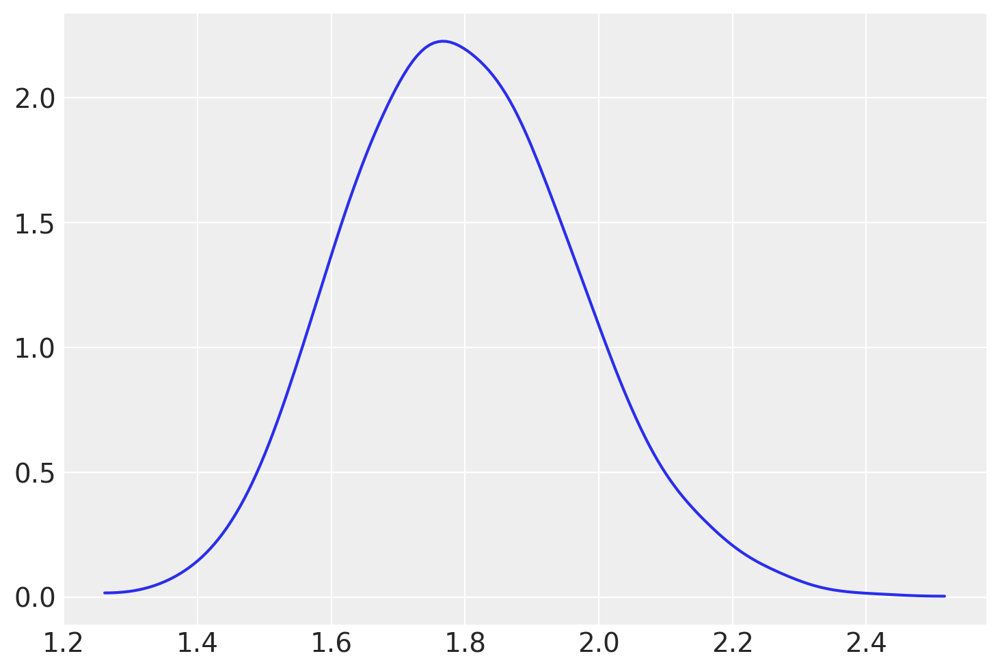

In [9]:
pos = np.random.uniform(1, 1.1, size=(12, 10000)).prod(0)
az.plot_kde(pos);

#### Code 4.4

Text(0.5, 1.0, 'm of small numbers')

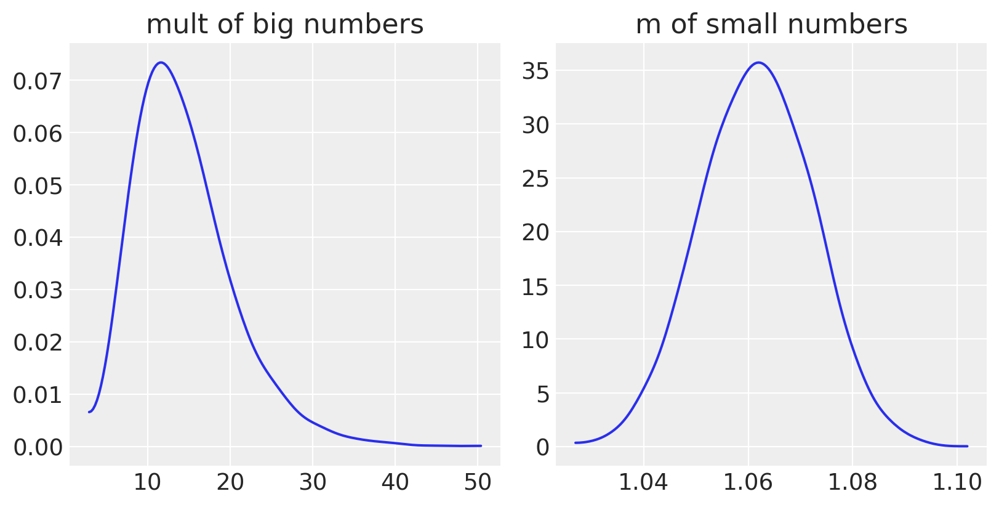

In [10]:
big = np.random.uniform(1, 1.5, size=(12, 10000)).prod(0)
small = np.random.uniform(1, 1.01, size=(12, 10000)).prod(0)
_, ax = plt.subplots(1, 2, figsize=(8, 4))
az.plot_kde(big, ax=ax[0])
ax[0].set_title('mult of big numbers')
az.plot_kde(small, ax=ax[1]);
ax[1].set_title('m of small numbers')

### 4.1.3. Normal by log-multiplication

#### Code 4.5

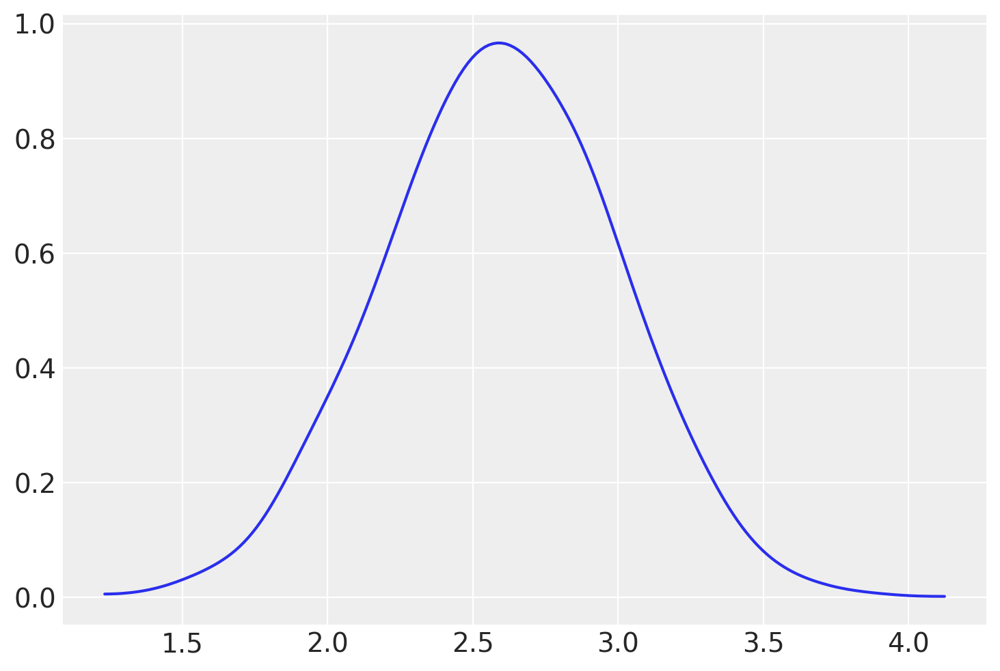

In [11]:
log_big = np.log(np.random.uniform(1, 1.5, size=(12, 10000)).prod(0))
az.plot_kde(log_big);

### 4.2.1 Re-describing the globe tossing model.

The model is designed to be:
$$
    W \sim \mathrm{Binomial}(N,p) \\
    p \sim \mathrm{Uniform}(0,1)
$$

This statement should be read as:

- The count $W$ is distributed binomially with sample size $N$ and probability $p$.
- The prior for $p$ is assumed to be uniform between zero and one.

Once we know the model in this way, we automatically know all of its assumptions.
- Both of the lines in this model are **stochastic**, as indicated by the $\sim$ symbol.

#### Code 4.6

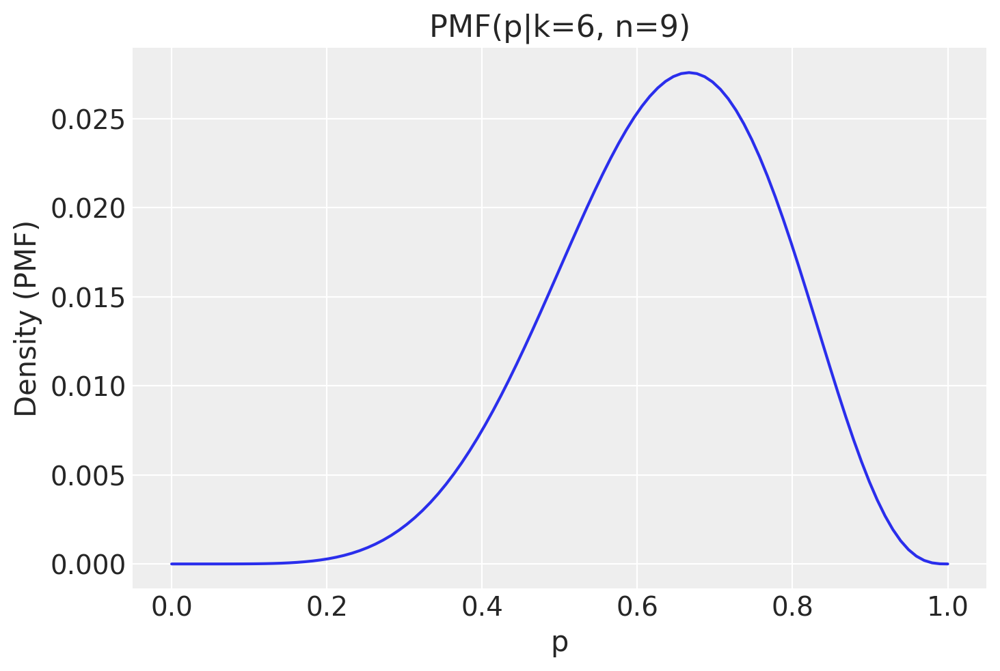

In [12]:
w, n = 6, 9
p_grid = np.linspace(0, 1, 100)
posterior = stats.binom.pmf(k=w, n=n, p=p_grid) * stats.uniform.pdf(p_grid, 0, 1)
posterior = posterior / (posterior).sum()
plt.plot(p_grid, posterior)
plt.xlabel("p")
plt.ylabel("Density (PMF)");
plt.title(f'PMF(p|k={w}, n={n})');

In [13]:
sum(posterior)

1.0000000000000002

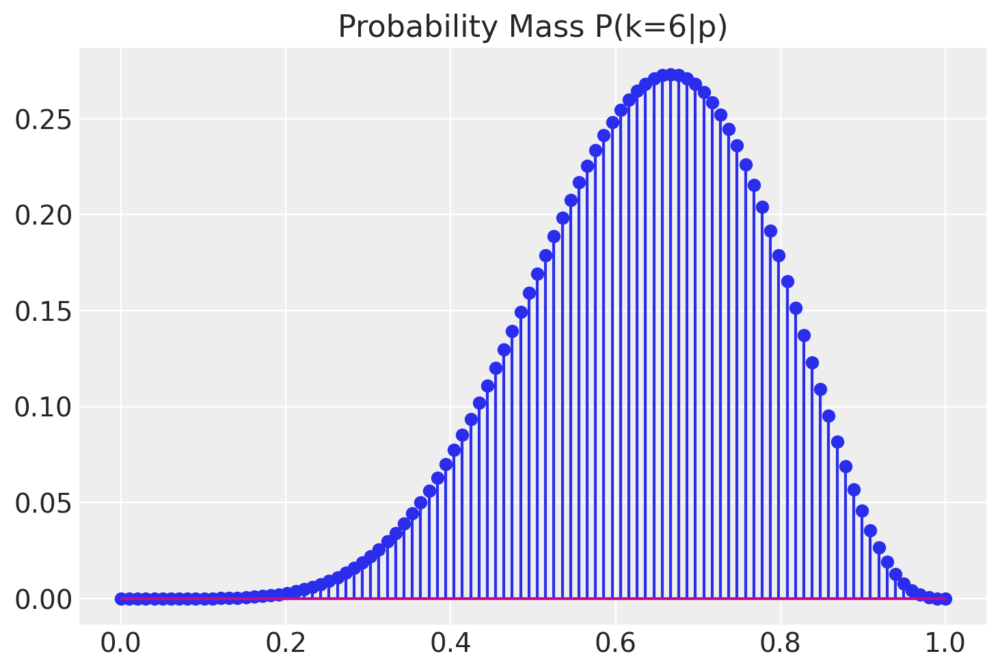

In [14]:
b = stats.binom.pmf(k=w, n=n, p=p_grid); b.shape
plt.stem(p_grid, b);
plt.title(f'Probability Mass P(k={w}|p)');

Text(0.5, 1.0, 'Discrete Uniform Dist')

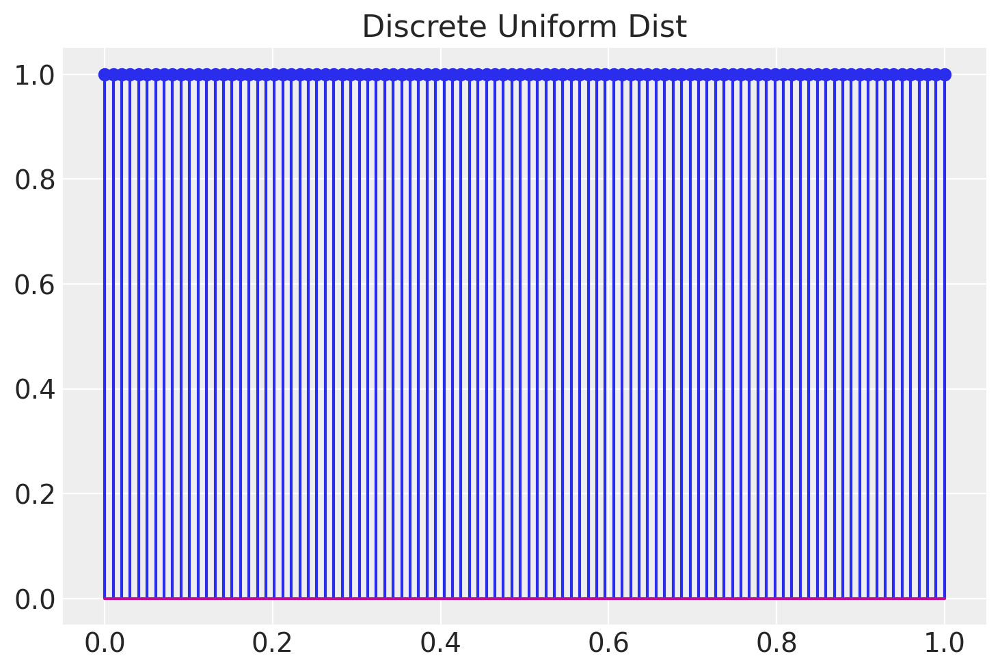

In [15]:
u = stats.uniform.pdf(p_grid, 0, 1)
plt.stem(p_grid, u)
plt.title('Discrete Uniform Dist')

## 4.3. Gaussian model of height

### 4.3.1. The Data

#### Code 4.7 and 4.8

In [16]:
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


In [17]:
type(d)

pandas.core.frame.DataFrame

#### Code 4.9

In [18]:
# HDI: Highest Density Interval
az.summary(d.to_dict(orient="list"), kind="stats")

,mean,sd,hdi_5.5%,hdi_94.5%
height,138.264,27.602,90.805,170.180
weight,35.611,14.719,11.368,55.707
age,29.344,20.747,0.000,57.000
male,0.472,0.500,0.000,1.000


In [19]:
d.describe()

,height,weight,age,male
count,544.000000,544.000000,544.000000,544.000000
mean,138.263596,35.610618,29.344393,0.472426
std,27.602448,14.719178,20.746888,0.499699
min,53.975000,4.252425,0.000000,0.000000
25%,125.095000,22.007717,12.000000,0.000000
50%,148.590000,40.057844,27.000000,0.000000
75%,157.480000,47.209005,43.000000,1.000000
max,179.070000,62.992589,88.000000,1.000000


In [20]:
d.to_dict(orient='list').keys()

dict_keys(['height', 'weight', 'age', 'male'])

(30, 514, 81.28, 165.735, 0.8897058823529411)

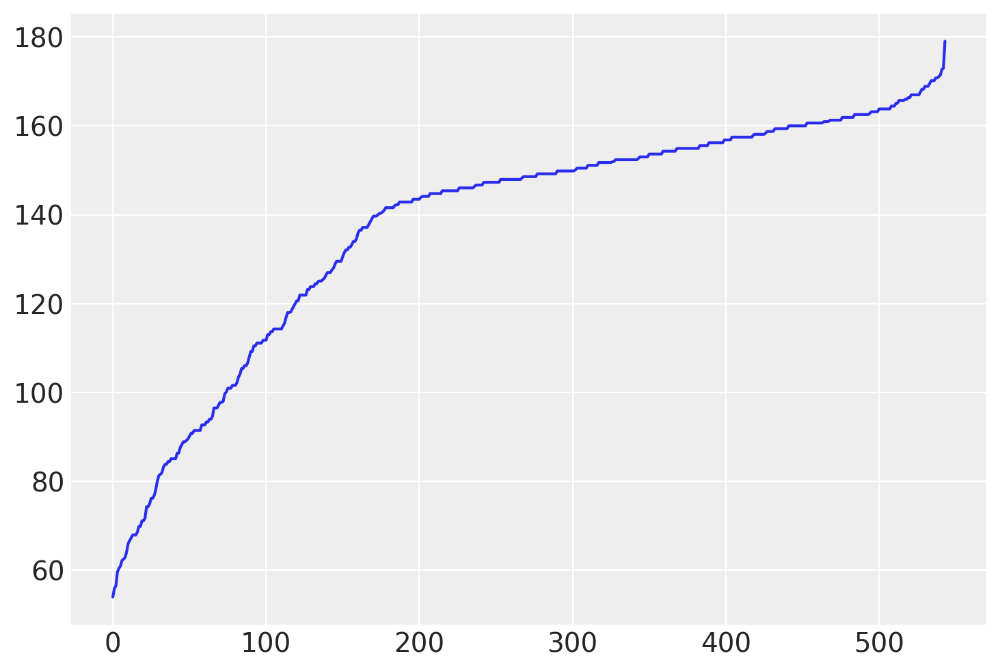

In [21]:
h = np.sort(d.height)
plt.plot(h)
lb, ub = int(len(h)*5.5/100+.5), int(len(h)*94.5/100 + .5); 
lb, ub, h[lb], h[ub], (ub-lb)/len(h)  # percentiles

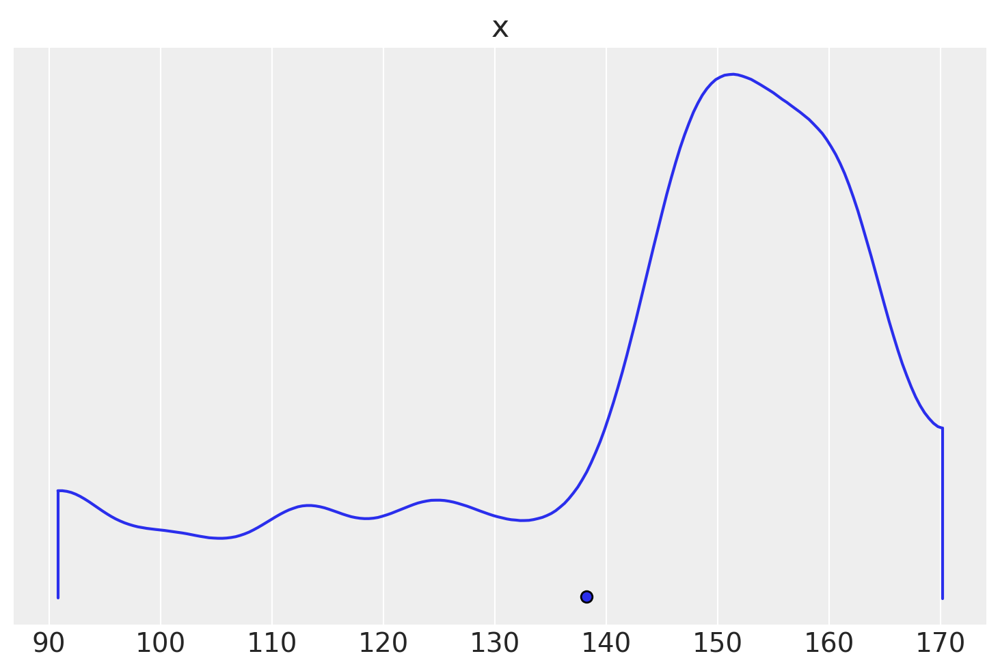

In [22]:
az.plot_density(d.height.values); # KDE plot between HDI

array([ 90.805, 170.18 ])

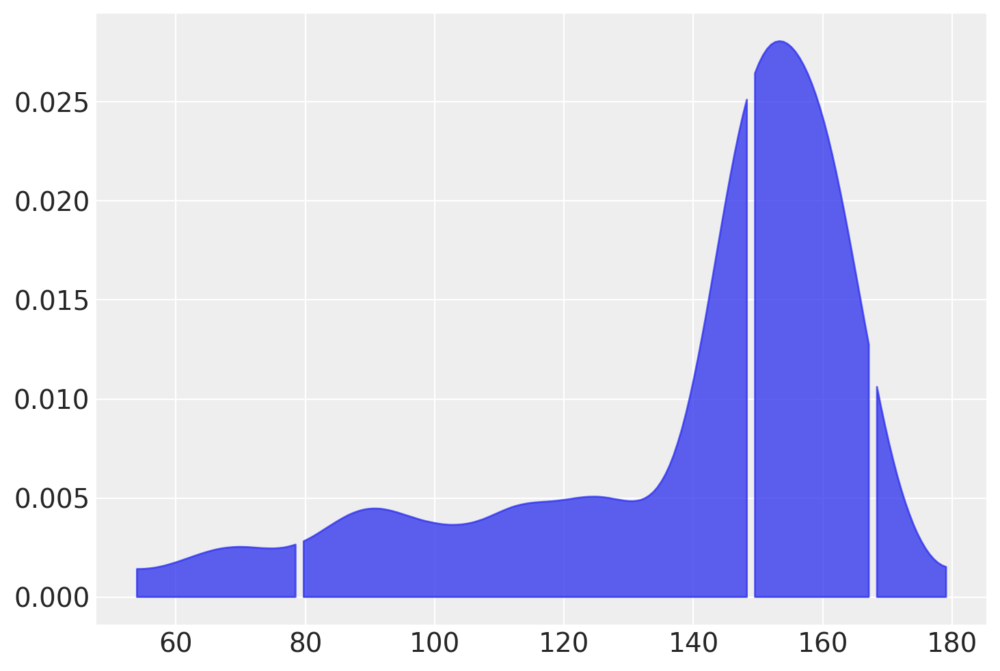

In [23]:
az.plot_kde(d.height.values, quantiles=[.055, .945, .5])
az.hdi(d["height"].values, hdi_prob=.89)

In [24]:
d.height.values[:10]

array([151.765, 139.7  , 136.525, 156.845, 145.415, 163.83 , 149.225,
       168.91 , 147.955, 165.1  ])

#### Code 4.10

In [25]:
d.height

0      151.765
1      139.700
2      136.525
3      156.845
4      145.415
        ...   
539    145.415
540    162.560
541    156.210
542     71.120
543    158.750
Name: height, Length: 544, dtype: float64

#### Code 4.11

In [26]:
# Data, with age 18 or greater
d2 = d[d.age >= 18]

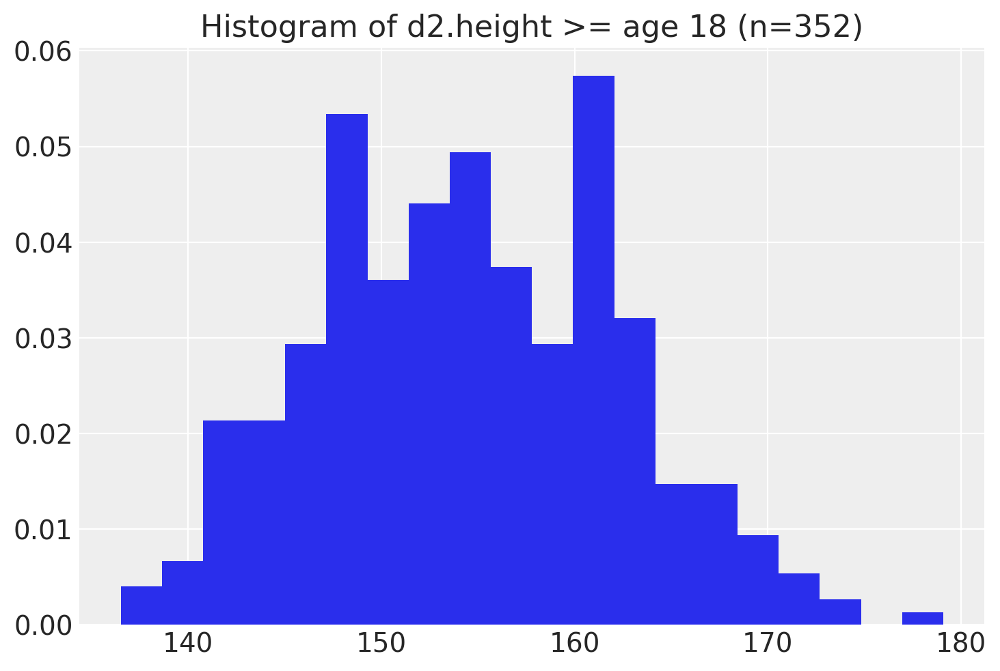

In [27]:
plt.hist(d2.height, bins=20, density=True);
plt.title(f'Histogram of d2.height >= age 18 (n={len(d2)})');

Do you think this looks like a Gaussian?

### 4.3.2. The model


- The heights in d2 are modeled to be samples from Gaussian (or Normal):

$$
    h_i \sim \mathrm{Normal}(\mu, \sigma)
$$

Here, the values $h_i$ are assumed to be independent and identically distributed (iid).

- To complete the model, we need priors. 
- The parameters to be estimated are both $\mu$ and $\sigma$, so we need a prior $\mathrm{Pr}(\mu, \sigma)$, the joint prior probability for all parameters.
- We assume $\mathrm{Pr}(\mu, \sigma) = \mathrm{Pr}(\mu) \mathrm{Pr}(\sigma)$.
- So this is our model:

$$
    \begin{align}
        h_i & \sim \mathrm{Normal}(\mu, \sigma)    \\
        \mu & \sim \mathrm{Normal}(178, 20) \\
        \sigma & \sim \mathrm{Uniform}(0, 50)
    \end{align}
$$

1. Why $\mathrm{Normal}(178, 20)$?
    - The author of book is 178cm tall.
    - The range $[178-2*20, 178+2*20] = [138, 218]$, 95% of the density, encompasses a huge range of plausible mean heights for human population - a domain-specific information!

#### Code 4.12

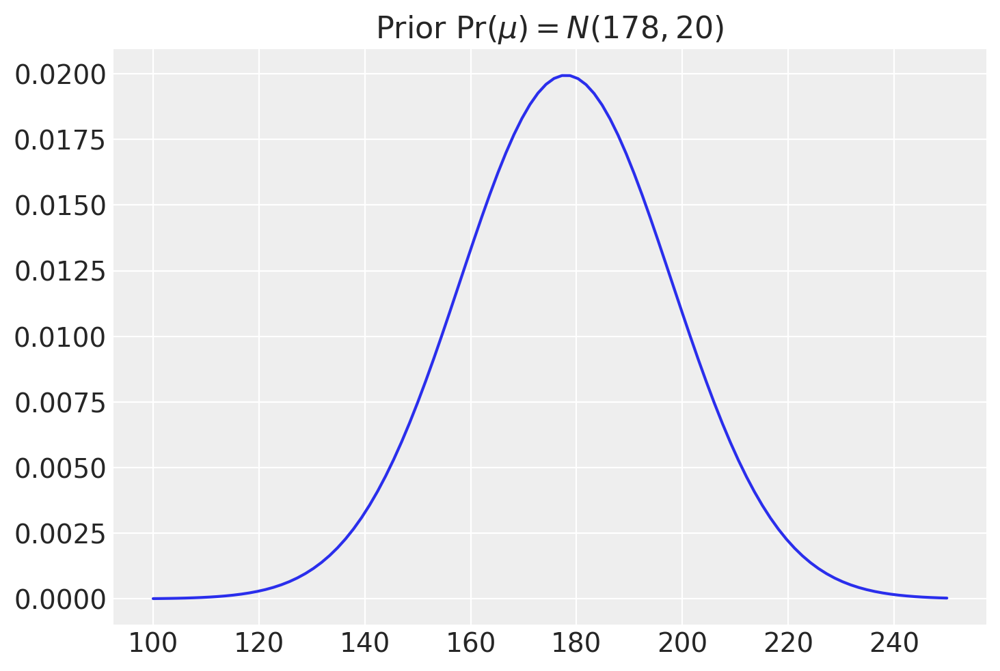

In [28]:
x = np.linspace(100, 250, 100)
plt.plot(x, stats.norm.pdf(x, 178, 20));
plt.title('Prior $\mathrm{Pr}(\mu) = N(178,20)$');

#### Code 4.13

- $\sigma=50$ implies that the heights will lie within 100cm of the average height.

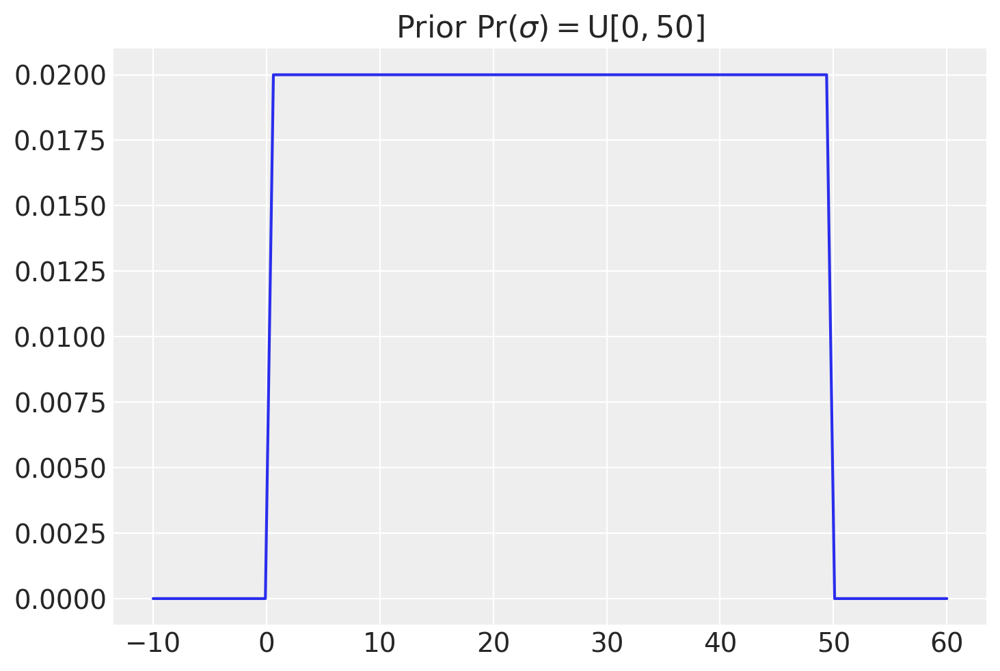

In [29]:
x = np.linspace(-10, 60, 100)
plt.plot(x, stats.uniform.pdf(x, 0, 50));
plt.title('Prior $\mathrm{Pr}(\sigma) = \mathrm{U[0,50]}$');

**Prior Predictive Simulation** to examine the model.

#### Code 4.14

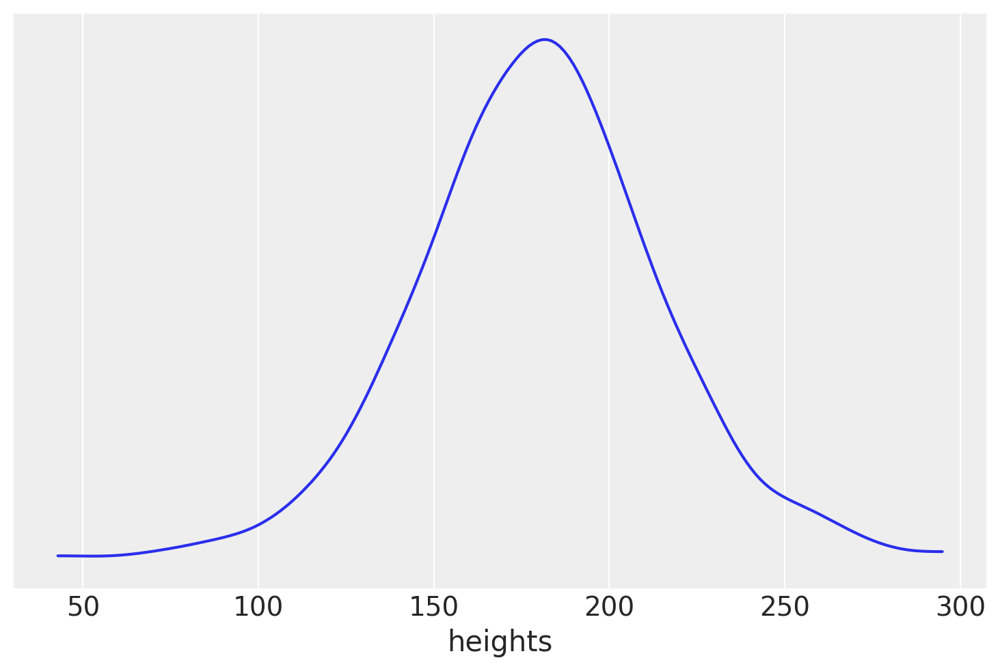

In [30]:
n_samples = 1000
sample_mu = stats.norm.rvs(loc=178, scale=20, size=n_samples)
sample_sigma = stats.uniform.rvs(loc=0, scale=50, size=n_samples)
prior_h = stats.norm.rvs(loc=sample_mu, scale=sample_sigma)  # predictive sampling

fig,ax=plt.subplots(1,1)
az.plot_kde(prior_h, ax=ax)
plt.xlabel("heights")
plt.yticks([]);

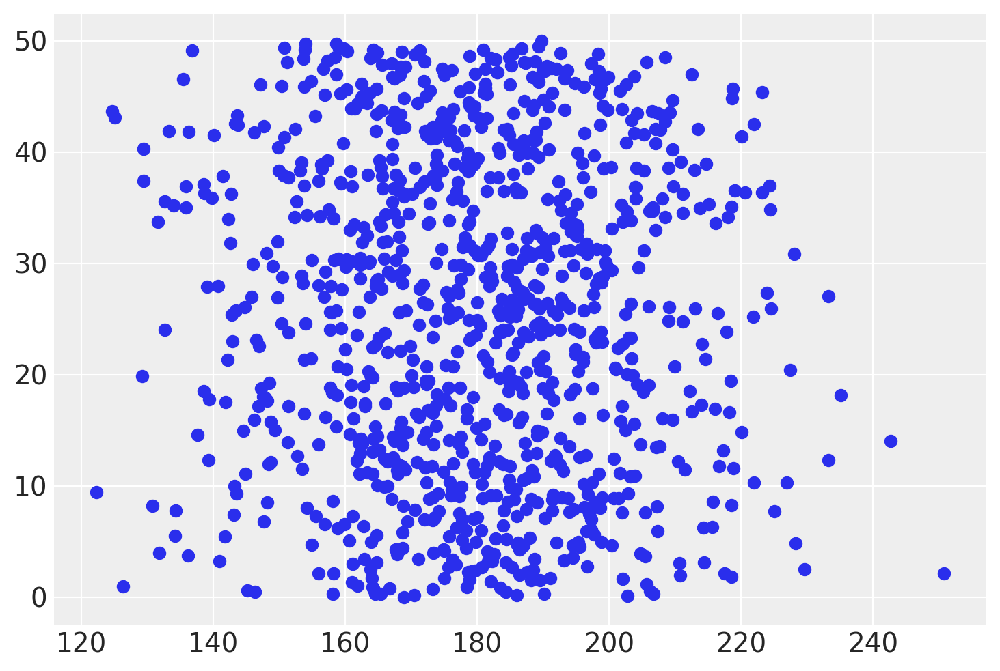

In [31]:
plt.scatter(sample_mu, sample_sigma);

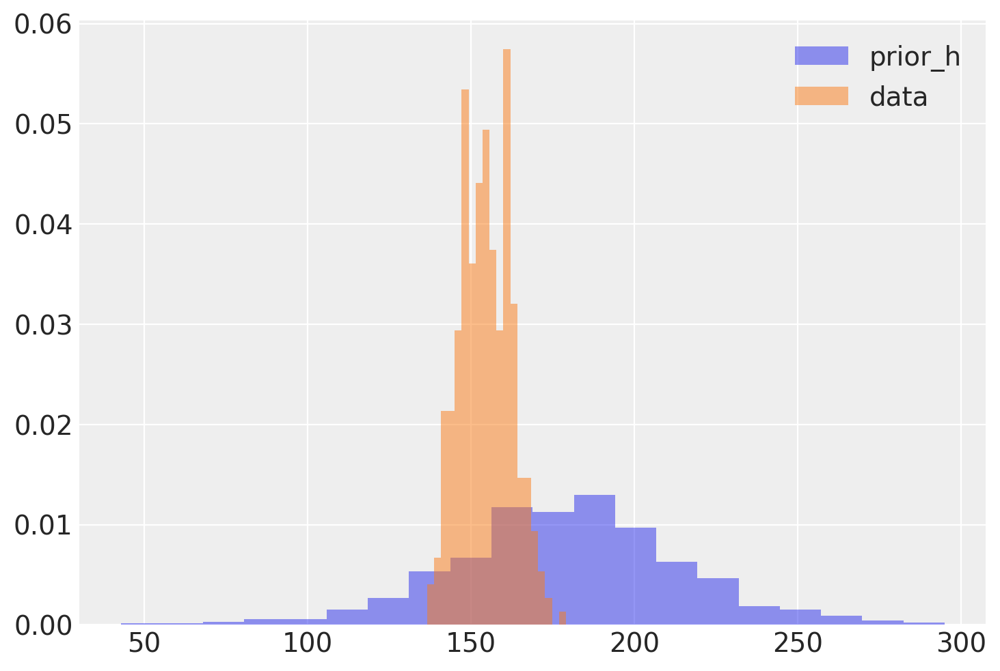

In [32]:
kwargs = dict(alpha=.5, bins=20)
plt.hist(prior_h, density=True, **kwargs, label='prior_h')
plt.hist(d2.height, density=True, **kwargs, label='data');
plt.legend();

Prior predictive simulation is very useful for assigning sensible priors, because it can be quite hard to anticipate how priors influence the observable variables.
- When a much flatter and less informative prior for $\mu$ is used, the simulation even shows negative heights in the following,
- and it also expects giants!

#### Code 4.15

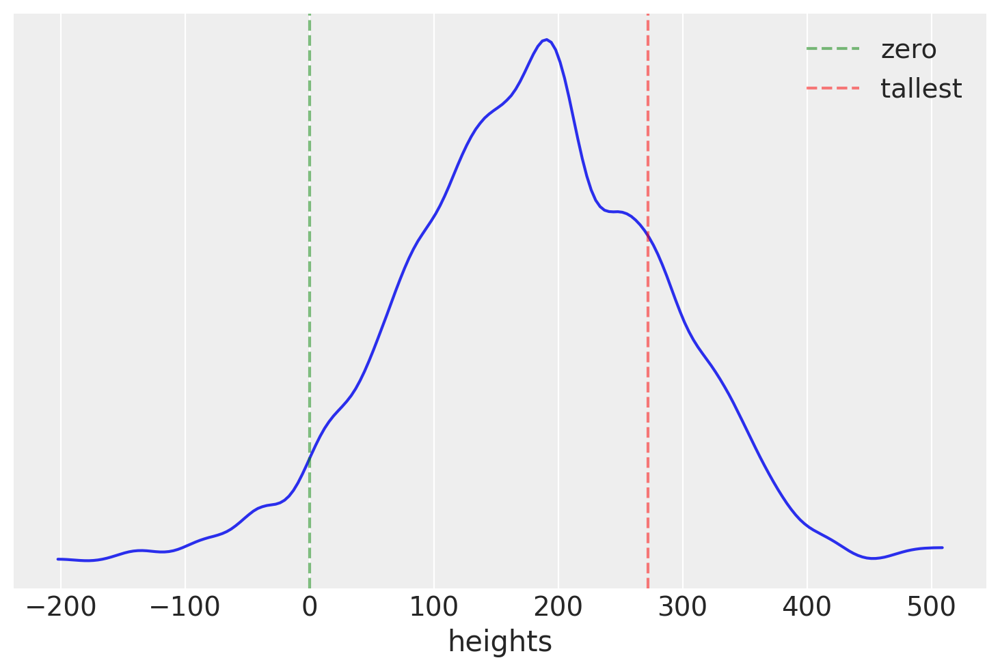

In [34]:
n_samples = 1000
sample_mu = stats.norm.rvs(loc=178, scale=100, size=n_samples)
prior_h = stats.norm.rvs(loc=sample_mu, scale=sample_sigma)

fig, ax = plt.subplots(1,1)
az.plot_kde(prior_h, bw=2.5, ax=ax)  # try various values of bw (bandwidth)
plt.xlabel("heights")
plt.yticks([]);
ax.axvline(x=0, linestyle='--', color='g', alpha=.5, label='zero')
ax.axvline(x=272, linestyle='--', color='r', alpha=.5, label='tallest')
plt.legend()

### 4.3.3. Grid approximation of the posterior distribution

In [35]:
ngrid = 90
mu_list = np.linspace(150, 160, ngrid)
sigma_list = np.linspace(7, 9, ngrid)    # only consider these values

post_list = []
for m in mu_list:
    for s in sigma_list:
        ll = sum( stats.norm.logpdf(d2.height, loc=m, scale=s) )  # data likeli for (m,s) given
        post = ll + stats.norm.logpdf(m, loc=178, scale=20) + stats.uniform.logpdf(s, 0, 50)
        post_list.append(post)
post_list = np.array(post_list)
post_prob = np.exp(post_list - max(post_list))

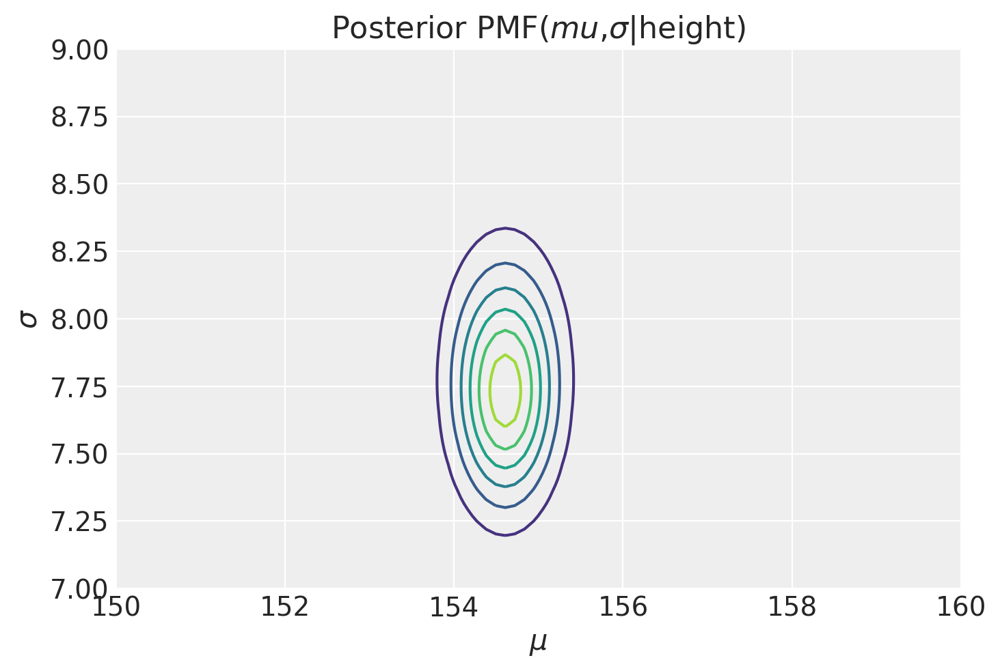

In [36]:
# meshgrid
def LogPostProb(m, s, height):
    ll = sum( [stats.norm.logpdf(height[k], loc=m, scale=s) for k in range(len(d2))] )
    p = ll + stats.norm.logpdf(m, loc=178, scale=20) + stats.uniform.logpdf(s, 0, 50)
    return p

X, Y = np.meshgrid(mu_list, sigma_list)
X.shape, Y.shape, X, Y

Z = LogPostProb(X, Y, d2.height.values)

post_prob_un = np.exp(Z - max(Z.ravel()))
post_prob = post_prob_un / post_prob_un.sum()

plt.contour(X,Y,post_prob)
plt.title('Posterior PMF($mu$,$\sigma$|height)')
plt.xlabel('$\mu$')
plt.ylabel('$\sigma$');

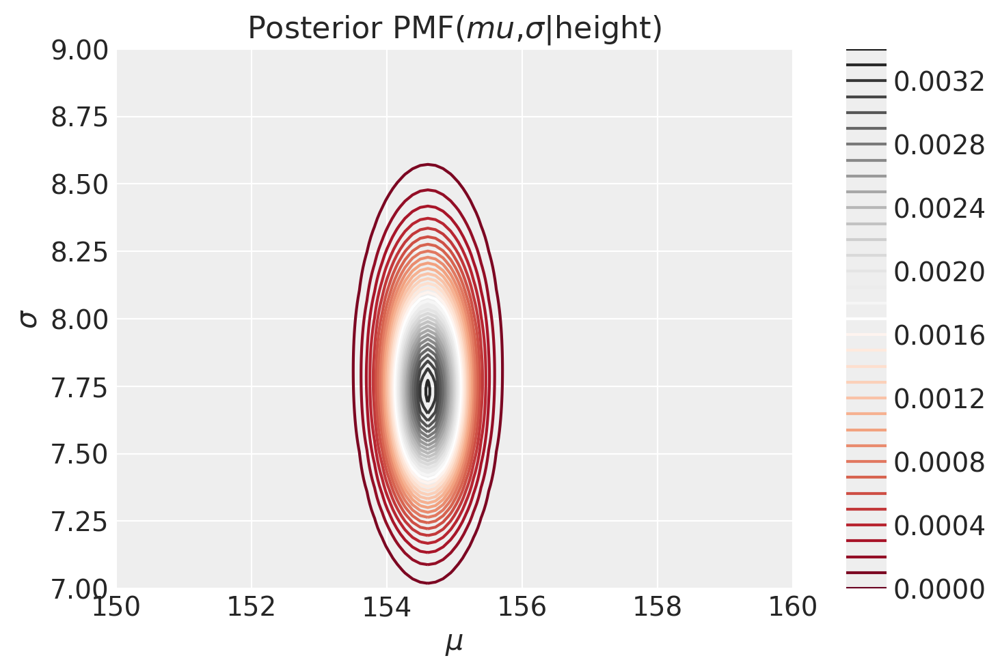

In [37]:
plt.contour(X, Y, post_prob, 40, cmap='RdGy')
plt.colorbar()
plt.title('Posterior PMF($mu$,$\sigma$|height)')
plt.xlabel('$\mu$')
plt.ylabel('$\sigma$');

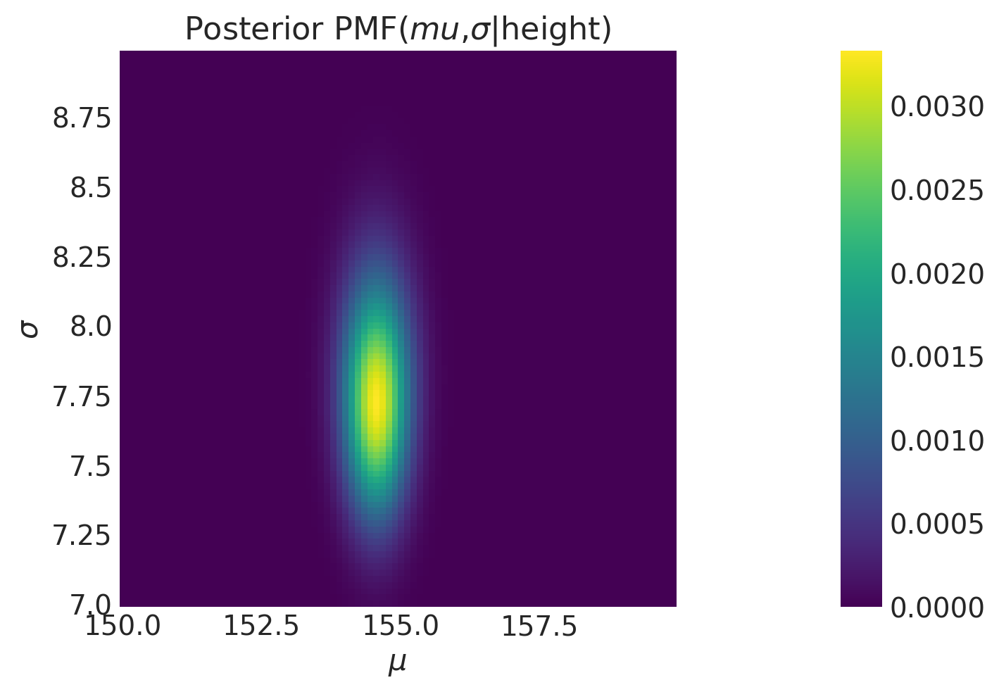

In [38]:
plt.imshow(post_prob,  origin='lower')
plt.colorbar()
plt.xticks(ticks=np.linspace(0, ngrid, 5), labels=np.linspace(150, 160, 5))
plt.yticks(ticks=np.linspace(0, ngrid, 9), labels=np.linspace(7, 9, 9))
plt.axis('image')
plt.grid(False)
plt.title('Posterior PMF($mu$,$\sigma$|height)')
plt.xlabel('$\mu$')
plt.ylabel('$\sigma$');

#### Code 4.16

In [39]:
post = np.mgrid[150:160:0.05, 7:9:0.05].reshape(2, -1).T

likelihood = [
    sum(stats.norm.logpdf(d2.height, loc=post[:, 0][i], scale=post[:, 1][i]))
    for i in range(len(post))
]

post_prod = (
    likelihood
    + stats.norm.logpdf(post[:, 0], loc=178, scale=20)
    + stats.uniform.logpdf(post[:, 1], loc=0, scale=50)
)
post_prob = np.exp(post_prod - max(post_prod))

In [40]:
post

array([[150.  ,   7.  ],
       [150.  ,   7.05],
       [150.  ,   7.1 ],
       ...,
       [159.95,   8.85],
       [159.95,   8.9 ],
       [159.95,   8.95]])

#### Code 4.17

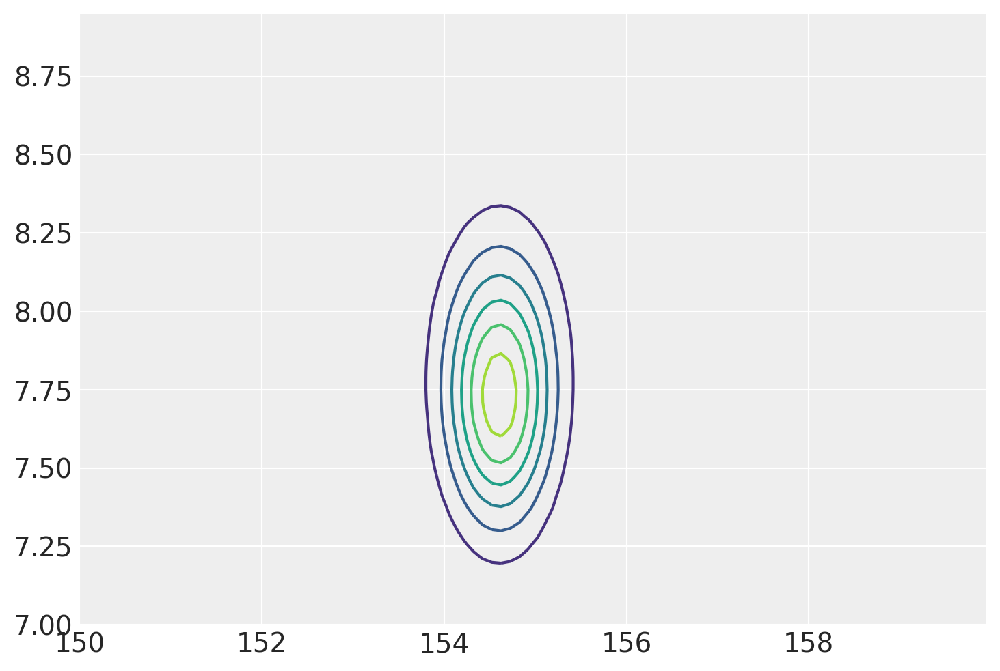

In [41]:
xi = np.linspace(post[:, 0].min(), post[:, 0].max(), 100)
yi = np.linspace(post[:, 1].min(), post[:, 1].max(), 100)
zi = griddata((post[:, 0], post[:, 1]), post_prob, (xi[None, :], yi[:, None]))

plt.contour(xi, yi, zi);

#### Code 4.18

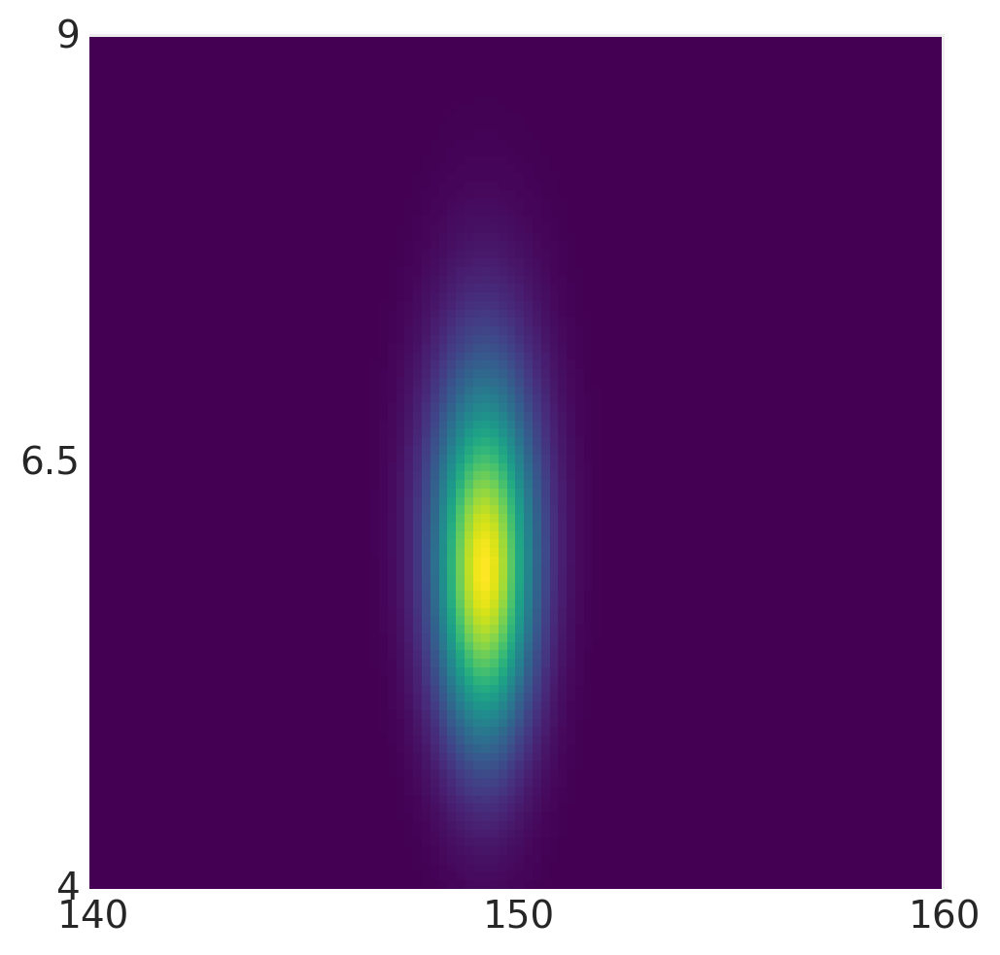

In [42]:
_, ax = plt.subplots()
ax.imshow(zi, origin="lower")
ax.set_xticks([0, 50, 100])
ax.set_xticklabels([140, 150, 160])
ax.set_yticks([0, 50, 100])
ax.set_yticklabels([4, 6.5, 9])
ax.grid(False);

In [43]:
len(post), post.shape

(8000, (8000, 2))

Below (Figure 4.4): Samples from the posterior distribution for the heights data. The density of points is highest in the center.

#### Code 4.19 and 4.20

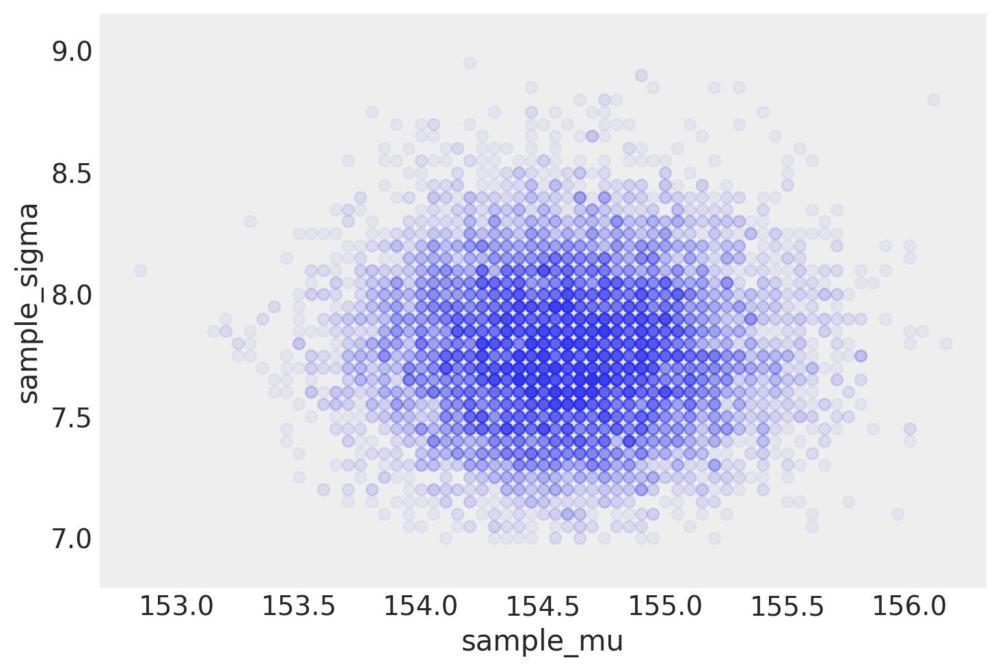

In [44]:
sample_rows = np.random.choice(
    np.arange(len(post)), size=10000, replace=True, p=(post_prob / post_prob.sum())
) # random sample among the discrete parameters, actually sample indices of array 'post'

sample_mu = post[:, 0][sample_rows]
sample_sigma = post[:, 1][sample_rows]

plt.plot(sample_mu, sample_sigma, "o", alpha=0.05)
plt.axis("equal")
plt.grid(False)
plt.xlabel("sample_mu")
plt.ylabel("sample_sigma");

**Marginal** posterior densities  of $\mu$ and $\sigma$.
- The term **marginal** here means "averaging over the other parameters."
- The two densidies (PMF actually) are very close to being normal distributions, which is quite typical.
- The density for $\sigma$ has a longer right-hand tail if you look closely, which is a very common happening.

#### Code 4.21

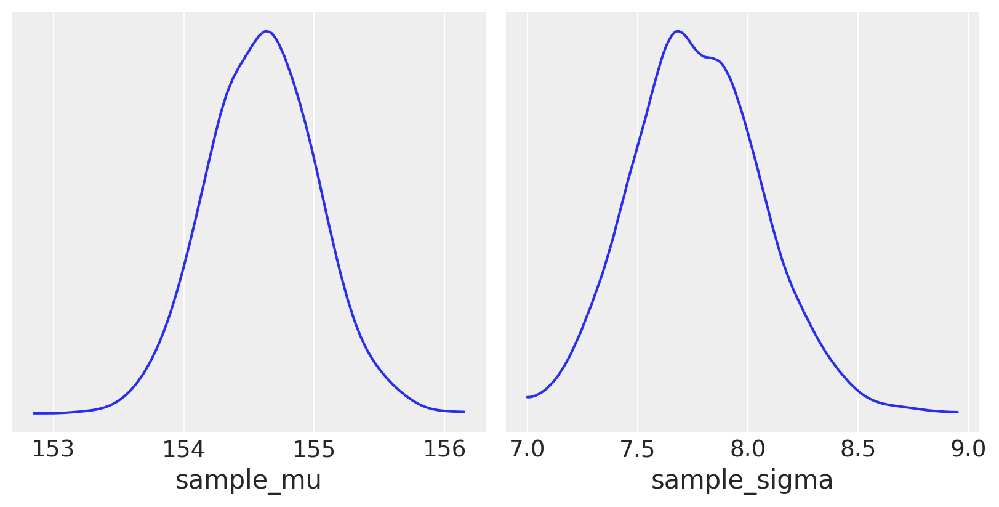

In [45]:
_, ax = plt.subplots(1, 2, figsize=(8, 4))
az.plot_kde(sample_mu, ax=ax[0])
ax[0].set_xlabel("sample_mu")
ax[0].set_yticks([])
az.plot_kde(sample_sigma, ax=ax[1])
ax[1].set_xlabel("sample_sigma")
ax[1].set_yticks([]);

#### Code 4.22

In [46]:
az.hdi(sample_mu), az.hdi(sample_sigma)

(array([153.9, 155.2]), array([7.3, 8.2]))

**Overthinking: Sample size and normality of $\sigma$'s posterior.** It is worth repeating the analysis of the height data above, but now with only a fration of the original data.
- The reason is to demonstrate that the posterior is not alwaysso Gaussian in shape.
- The deep reason for the posterior of $\sigma$ tending to have a long right-hand tail are complex.

#### Code 4.23 and  4.24

In [47]:
d3 = np.random.choice(d2.height, 20)
post2 = np.mgrid[150:170:0.1, 4:20:0.1].reshape(2, -1).T

likelihood2 = [
    sum(stats.norm.logpdf(d3, loc=post2[:, 0][i], scale=post2[:, 1][i]))
    for i in range(len(post2))
]

post_prod2 = (
    likelihood2
    + stats.norm.logpdf(post2[:, 0], loc=178, scale=20)
    + stats.uniform.logpdf(post2[:, 1], loc=0, scale=50)
)

post_prob2 = np.exp(post_prod2 - max(post_prod2))

sample_rows2 = np.random.choice(
    np.arange(len(post2)), size=10000, replace=True, p=(post_prob2 / post_prob2.sum())
)
sample_mu2 = post2[:, 0][sample_rows2]
sample_sigma2 = post2[:, 1][sample_rows2]

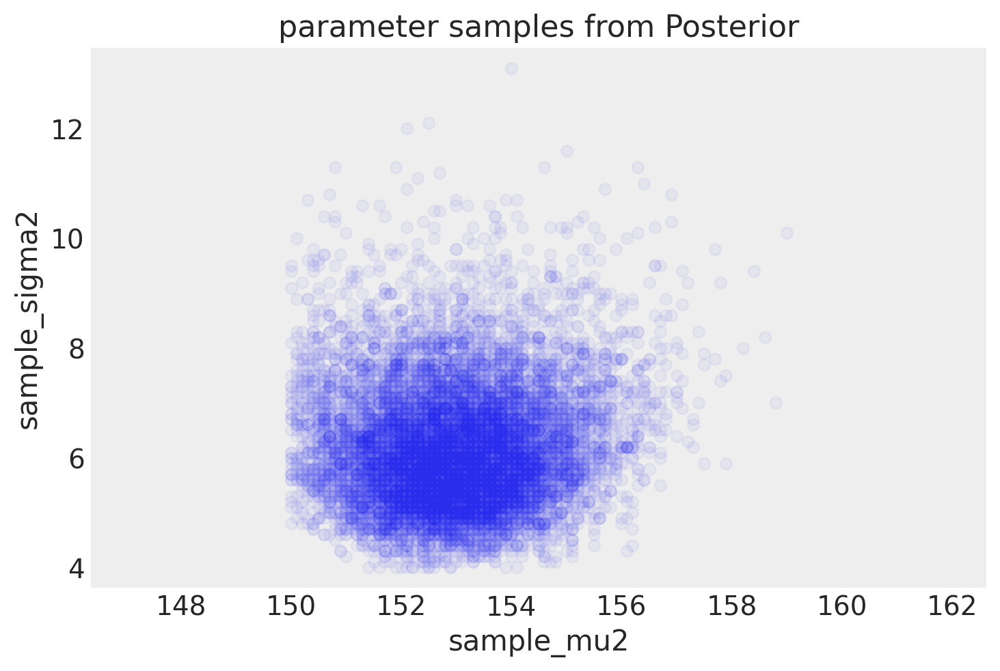

In [48]:
plt.plot(sample_mu2, sample_sigma2, "o", alpha=0.05)
plt.axis("equal")
plt.xlabel("sample_mu2")
plt.ylabel("sample_sigma2")
plt.title('parameter samples from Posterior')
plt.grid(False);

#### Code 4.25

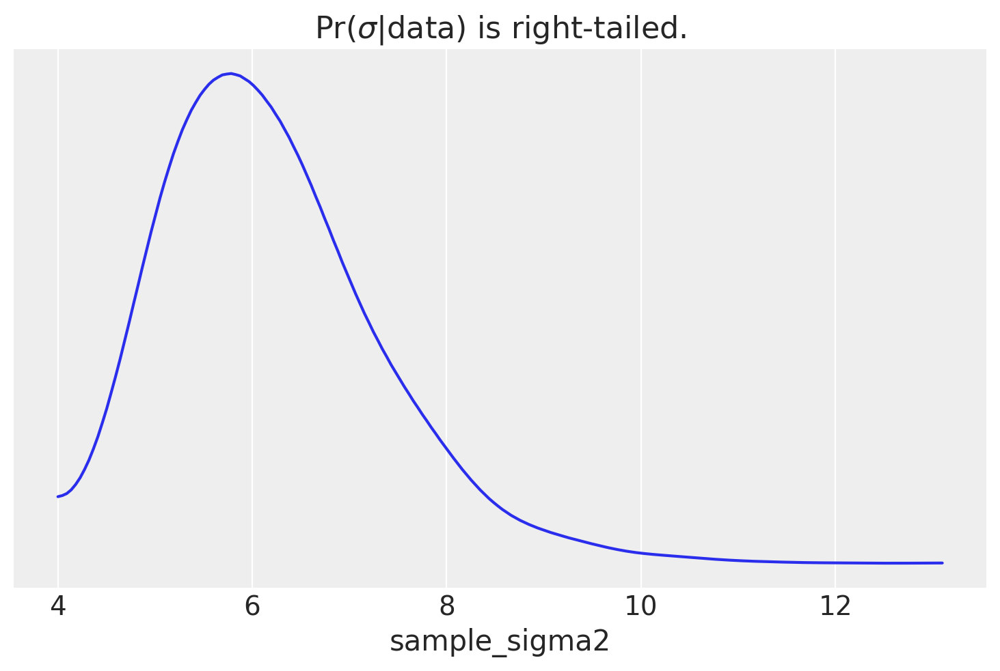

In [49]:
az.plot_kde(sample_sigma2)
plt.xlabel("sample_sigma2")
plt.title('Pr($\sigma$|data) is right-tailed.')
plt.yticks([]);

### 4.3.5. Finding the posterior distribution with pymc3 (instead of quap)
- The book uses the quadratic approximation.

#### Code 4.26

We are repeating code 4.7, 4.8 and 4.10

In [50]:
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d2 = d[d.age >= 18]

#### Code 4.27

In [51]:
with pm.Model() as m4_1:
    mu = pm.Normal("mu", mu=178, sd=20)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)

#### Code 4.28

We could use a quadratic approximation like McElreath does in his book and we did in code 2.6. But Using PyMC3 is really simple to just sample from the model using a "sampler method". Most common sampler methods are members of the Markov Chain Monte Carlo Method (MCMC) family (for details read Section 2.4.3 and Chapter 8 of Statistical Rethinking).

PyMC3 comes with various samplers. Some samplers are more suited than others for certain type of variable (and/or problems). For now we are going to let PyMC3 choose the sampler for us. PyMC3 also tries to provide a reasonable starting point for the simulation. By default PyMC3 uses the same adaptive procedure as in STAN `'jitter+adapt_diag'`, which starts with a identity mass matrix and then adapts a diagonal based on the variance of the tuning samples. 

You can read more details of PyMC3 [here](http://pymc-devs.github.io/pymc3/notebooks/getting_started.html)

In [52]:
with m4_1:
    trace_4_1 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


In [53]:
type(trace_4_1)

pymc3.backends.base.MultiTrace

In [54]:
trace_4_1.varnames

['mu', 'sigma_interval__', 'sigma']

In [55]:
trace_4_1['mu'].shape, trace_4_1['sigma'].shape

((4000,), (4000,))

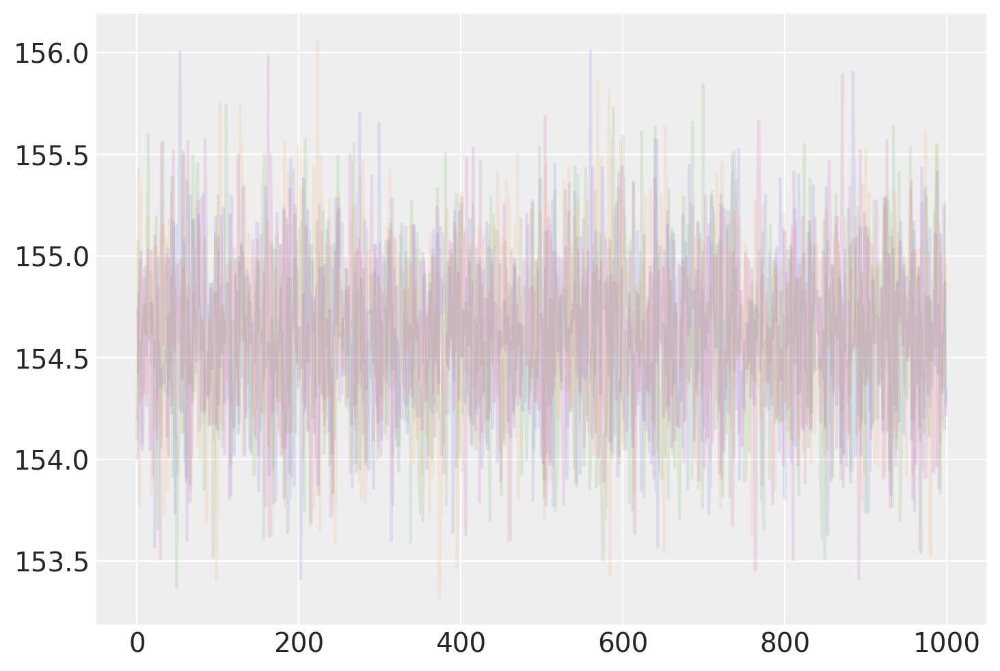

In [56]:
plt.plot(trace_4_1['mu'][:1000], alpha=0.1)
plt.plot(trace_4_1['mu'][1000:2000], alpha=0.1)
plt.plot(trace_4_1['mu'][2000:3000], alpha=0.1)
plt.plot(trace_4_1['mu'][3000:], alpha=0.1);

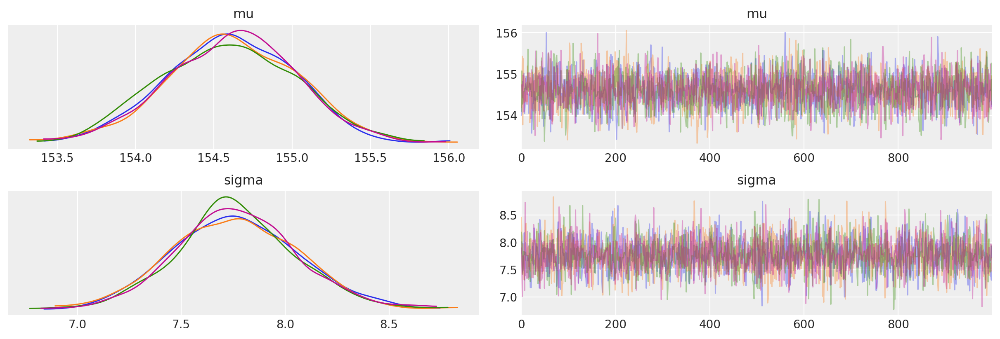

In [57]:
with m4_1:
    az.plot_trace(trace_4_1)

#### Code 4.29

In [58]:
with m4_1:
    print(az.summary(trace_4_1, round_to=2, kind="stats"))

         mean    sd  hdi_5.5%  hdi_94.5%
mu     154.61  0.41    153.91     155.23
sigma    7.76  0.30      7.29       8.23


#### Code 4.30

Although, unlike model specification in PyMC2, we do not typically provide starting points for variables at the model specification stage, we can also provide **an initial value** for any distribution (called a “test value”) using the `testval` argument. This overrides the default test value for the distribution (usually the mean, median or mode of the distribution), and is most often useful if some values are illegal and we want to ensure we select a legal one. The test values for the distributions are also used as a starting point for sampling and optimization by default, though this is easily overriden. [pymc3 getting started](https://docs.pymc.io/notebooks/getting_started.html)

In [59]:
with pm.Model() as m4_1:
    mu = pm.Normal("mu", mu=178, sd=20, testval=d2.height.mean())
    sigma = pm.Uniform("sigma", lower=0, upper=50, testval=d2.height.std())
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_1 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


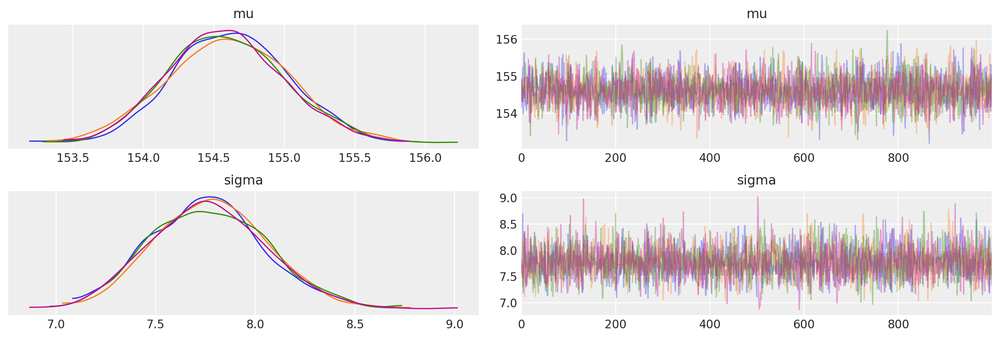

In [60]:
with m4_1:
    az.plot_trace(trace_4_1)

In [61]:
with m4_1:
    print(az.summary(trace_4_1, round_to=2, kind="stats"))

         mean    sd  hdi_5.5%  hdi_94.5%
mu     154.60  0.41    153.95     155.28
sigma    7.77  0.29      7.29       8.22


---
**Another Try:** New prior distribtuion, more informative for $\mu$

#### Code 4.31

In [62]:
with pm.Model() as m4_2:
    mu = pm.Normal("mu", mu=178, sd=0.1)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_2 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, mu]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [63]:
with m4_2:
    print(az.summary(trace_4_2, round_to=2, kind="stats"))

         mean    sd  hdi_5.5%  hdi_94.5%
mu     177.86  0.10    177.70     178.02
sigma   24.62  0.95     23.05      26.03


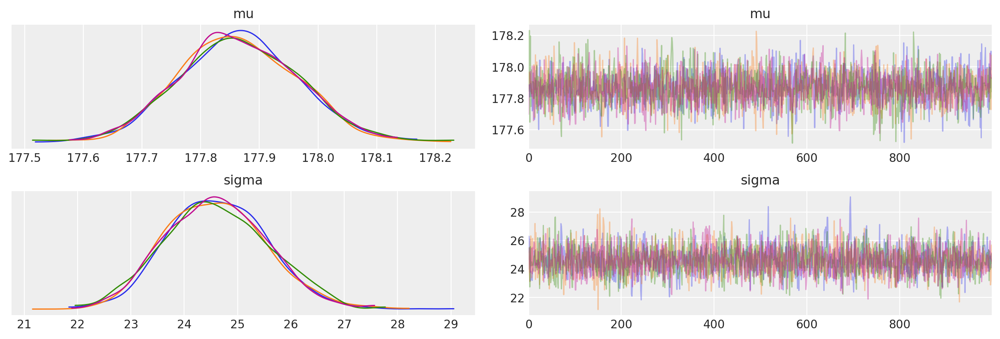

In [64]:
with m4_2:
    az.plot_trace(trace_4_2)

**Result:**
1. The estimate for $\mu$ has hardly moved off the prior. The prior was very concentrated around 178, so it is not surprising.
2. The estimate for $\sigma$ has changed quite a lot, even though we didn't change its prior at all.
3. Once the golem is certain that the mean is near 178 as the prior insists, the golem has to estimate $\sigma$ conditional on that fact.
4. This results in a different posterior for $\sigma$, even though all we changed is prior information about the other parameter.

#### Code 4.32

For some computations could be nice to have the trace turned into a DataFrame, this can be done using the `trace_to_dataframe` function

In [65]:
trace_df = pm.trace_to_dataframe(trace_4_1)
trace_df.cov()

,mu,sigma
mu,0.171992,0.000268
sigma,0.000268,0.085566


The above is a **variance-covariance** matrix.

#### Code 4.33

In [66]:
np.diag(trace_df.cov())  # variance of each parameter

array([0.17199176, 0.08556578])

In [67]:
trace_df.corr()  # correlation coefficient

,mu,sigma
mu,1.000000,0.002205
sigma,0.002205,1.000000


#### Code 4.34

We did not use the quadratic approximation, instead we use a MCMC method to sample from the posterior. Thus, we already have samples. We can do something like

In [68]:
trace_df.head()

,mu,sigma
0,154.147477,7.658956
1,154.282572,7.661134
2,154.907100,7.784215
3,155.237554,8.693186
4,153.987420,7.185380


Or directly from the trace (we are getting the first ten samples of _sigma_)

In [69]:
trace_4_1["sigma"][:10]

array([7.65895591, 7.66113364, 7.78421506, 8.69318574, 7.18538017,
       8.31676574, 8.0450803 , 8.06400096, 7.79760866, 7.3029849 ])

#### Code 4.35

In our case, this is the same we did in the code 4.27

In [73]:
with m4_1:
    print(az.summary(trace_4_1, round_to=2, kind="stats"))

         mean    sd  hdi_5.5%  hdi_94.5%
mu     154.60  0.41    153.95     155.28
sigma    7.77  0.29      7.29       8.22


---
**Overthinking: Under the hood with multivariate sampling**
We may use the mean and covariance matrix for a multivariate normal distribution to get some samples from the aporoximate posterior distribution.

#### Code 4.36

In [74]:
stats.multivariate_normal.rvs(mean=trace_df.mean(), cov=trace_df.cov(), size=10)

array([[155.07585116,   7.82395525],
       [154.74703797,   7.81873855],
       [154.52365003,   7.55841018],
       [154.93696606,   7.47125766],
       [154.55713342,   7.38993764],
       [154.63162085,   8.29113614],
       [154.41137096,   7.69653262],
       [154.38732455,   7.72837145],
       [154.44212319,   8.00935642],
       [154.79751017,   7.21815339]])

## 4.4. Linear Prediction

- If the predictor variable has any statistical association with the outcome variable, then we can use it to predict the outome.
- When the preditor variable is build inside the model in a partiular way, we'll have linear regression.

- Let's look at how height in Kalahari foragers covaries with weight.
    - the outcome variable: height
    - the predictor variable: weight

#### Code 4.37

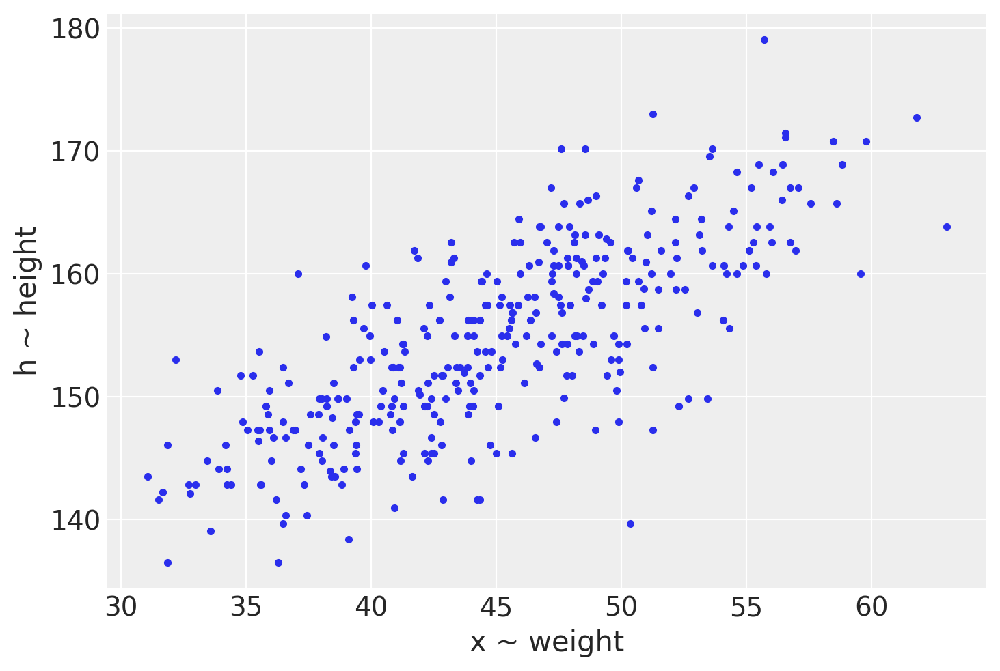

In [75]:
plt.plot(d2.weight, d2.height, ".");
plt.ylabel('h ~ height')
plt.xlabel('x ~ weight');

**Rethinking: What is “regression”?** Many diverse types of models are called “regression.” The term
has come to mean using one or more predictor variables to model the distribution of one or more
outcome variables. The original use of term, however, arose from anthropologist Francis Galton’s
(1822–1911) observation that the sons of tall and short men tended to be more similar to the popula-
tion mean, hence regression to the mean.

### 4.4.1. The linear model strategy

$$
    \begin{align}
        h_i    & \sim N(\mu_i, \sigma) \quad\quad\quad \mbox{ likelihood }\\
        \mu_i  & = \alpha + \beta (x_i - \bar{x})   \quad\quad \mbox{ linear model }\big( \mu \sim N(178,20) \quad\mbox{previously}\big)\\
        \alpha & \sim N(178, 20) \\
        \beta  & \sim N(0,10) \\
        \sigma & \sim U(0,50)
    \end{align}
$$

#### 4.4.1.1. Probability of the data (Likelihood)
The $i$ on $\mu_i$ indicates that the mean depends on the row $i$ in the dataframe.

#### 4.4.1.2. Linear model
- The mean $\mu$ is no longer a parameter to be estimated.
- Instead, $\mu_i$ is construted from other parameters, $\alpha$, $\beta$, and the observed variable $x_i$. This is not a stochasti relationship but a deterministic.
- The parameters $\alpha$ and $\beta$ are misterious. Where did they come from? We made them up.

$$
     \mu_i  = \alpha + \beta (x_i - \bar{x}) 
$$
1. What is the expected height when xi = ¯x? The parameter α answers this question,
because when $x_i = \bar{x}$, $\mu_i = α$. For this reason, α is often called the intercept. But we
should think not in terms of some abstract line, but rather in terms of the meaning
with respect to the observable variables.
2. What is the change in expected height, when xi changes by 1 unit? The parameter
β answers this question. It is often called a “slope,” again because of the abstract
line. Better to think of it as a rate of change in expectation.

Jointly these two parameters ask the golem to find a line that relates x to h, a line that passes
through α when $x_i = \bar{x}$ and has slope β. 

#### 4.4.1.3. Priors.

#### Code 4.38

In [76]:
np.random.seed(2971)
N = 200  # 100 lines
a = stats.norm.rvs(178, 20, N)  # alpha
b = stats.norm.rvs(0, 10, N)    # beta
a.shape, b.shape

((200,), (200,))

#### Code 4.39 and 4.40

In [77]:
x = np.linspace(30, 70, 100)

In [80]:
i = 10
xbar = d2.weight.mean()
m = b[i]*(x-xbar) + a[i]

xbar= 44.99048551988636


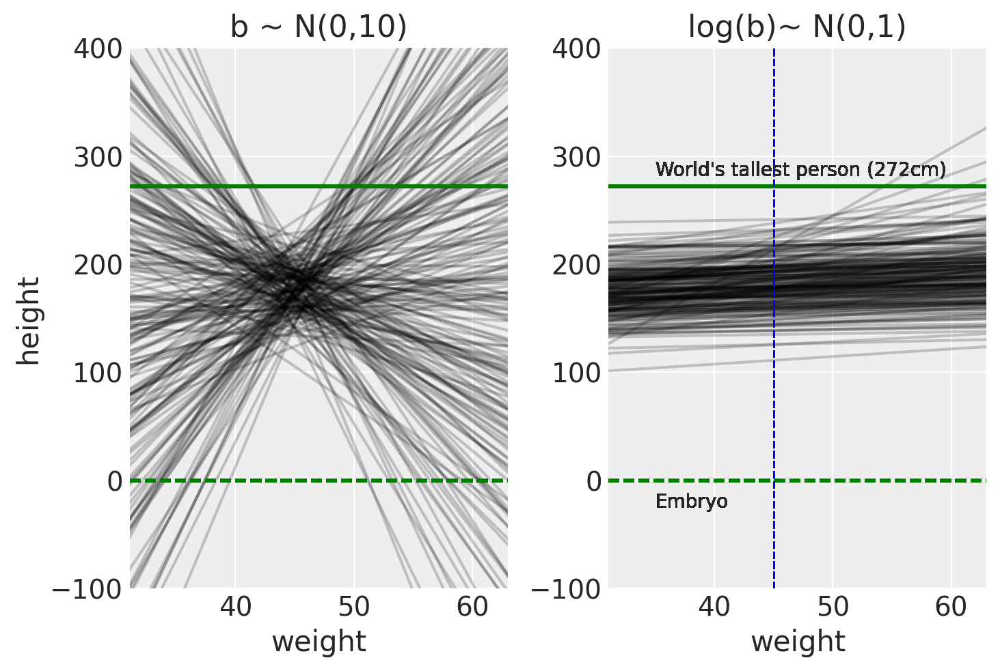

In [84]:
fig, ax = plt.subplots(1, 2)
xbar = d2.weight.mean()
print('xbar=', xbar)
for i in range(N):
    m_i = a[i] + b[i] * (x - xbar)
    ax[0].plot(x, m_i, "k", alpha=0.2)
    ax[0].set_xlim(d2.weight.min(), d2.weight.max())
    ax[0].set_ylim(-100, 400)
    ax[0].axhline(0, c="g", ls="--")
    ax[0].axhline(272, c="g")
    ax[0].set_xlabel("weight")
    ax[0].set_ylabel("height")
ax[0].set_title('b ~ N(0,10)')


lognorm_b = stats.lognorm.rvs(loc=0, s=1, scale=np.exp(0), size=N)
for i in range(N):
    ax[1].plot(a[i] + lognorm_b[i] * (x - xbar), "k", alpha=0.2)
    ax[1].set_xlim(d2.weight.min(), d2.weight.max())
    ax[1].set_ylim(-100, 400)
    ax[1].axhline(0, c="g", ls="--", label="embryo")
    ax[1].axhline(272, c="g")
    ax[1].set_xlabel("weight")
    ax[1].text(x=35, y=282, s="World's tallest person (272cm)")
    ax[1].text(x=35, y=-25, s="Embryo");
    ax[1].axvline(x=xbar, color='b', linewidth=1, linestyle='--')
ax[1].set_title('log(b)~ N(0,1)');

**Log-Normal distribution**, used to generate samples for the slope $\beta$.
- The samples are all positive. Why stick to positive? Because the scatter plot shows that the slop seems highly skewed to positve.
- See [Wikipedia's Log-Normal Distribution](https://en.wikipedia.org/wiki/Log-normal_distribution)

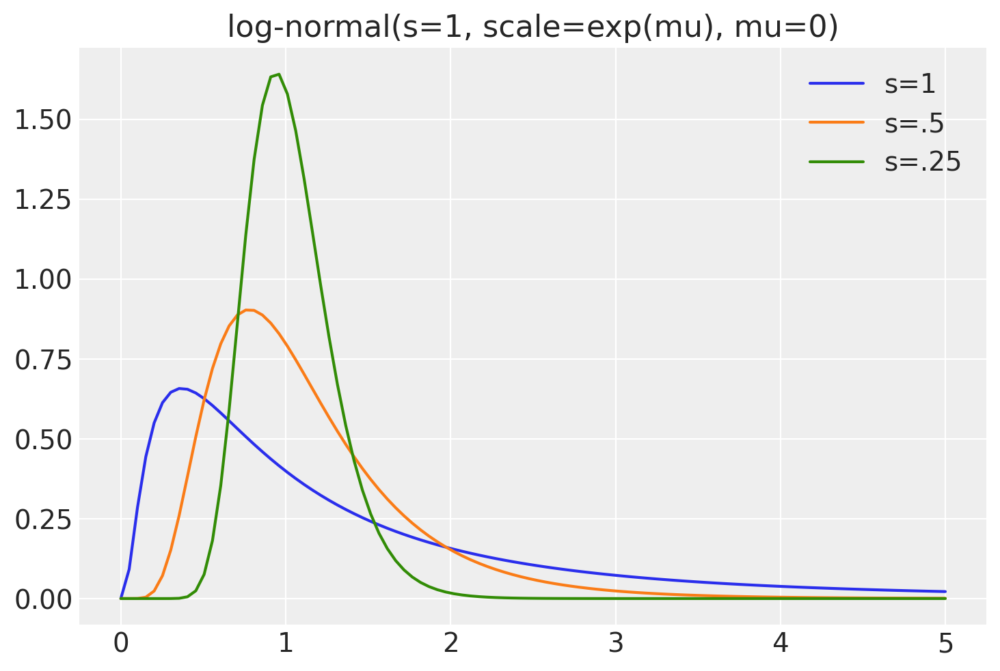

In [89]:
xxx = np.linspace(0, 5, 100)
plt.plot(xxx, stats.lognorm.pdf(xxx, loc=0, s=1, scale=np.exp(0)), label='s=1')
plt.plot(xxx, stats.lognorm.pdf(xxx, loc=0, s=.5, scale=np.exp(0)), label='s=.5')
plt.plot(xxx, stats.lognorm.pdf(xxx, loc=0, s=.25, scale=np.exp(0)), label='s=.25')
plt.legend()
plt.title('log-normal(s=1, scale=exp(mu), mu=0)');

Samples from the standard Log-Normal.

(0.0, 5.0)

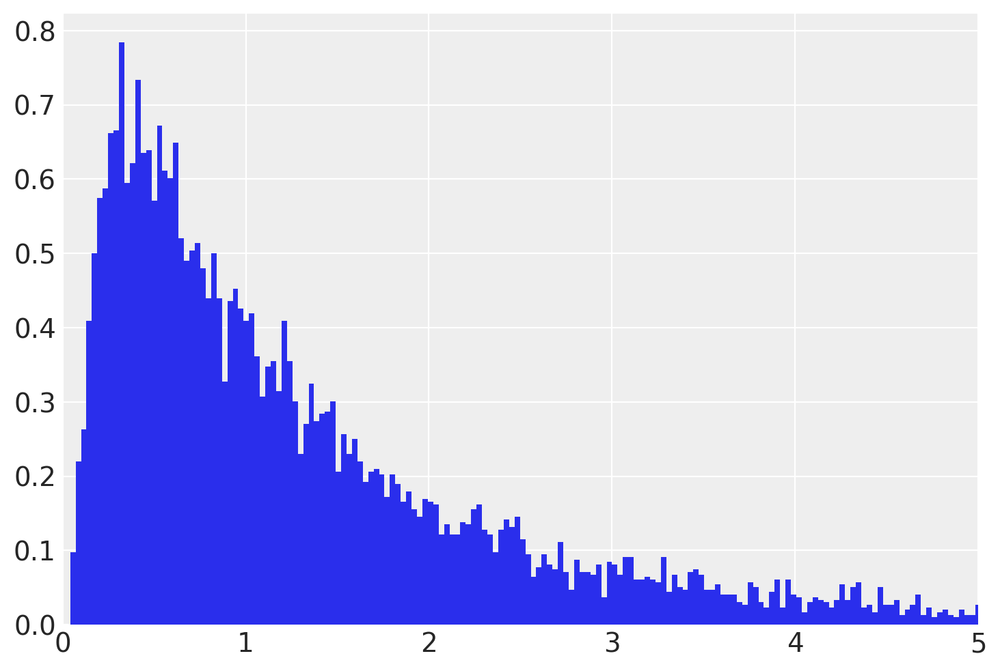

In [90]:
logbs = stats.norm.rvs(loc=0, scale=1, size=10000)
plt.hist(np.exp(logbs), bins=2000, density=True);
plt.xlim(0, 5)

### 4.4.2. Finding the posterior distribution.

The PYMC3 code needed to get samples from posterior density $p(\alpha, \beta, \sigma | \{w_i\})$ is below. 

$$
    \begin{align}
        h_i    & \sim N(\mu_i, \sigma) \quad\quad\quad \mbox{ likelihood }\\
        \mu_i  & = \alpha + \beta (x_i - \bar{x})   \quad\quad \mbox{ linear model }\big( \mu \sim N(178,20) \quad\mbox{previously}\big)\\
        \alpha & \sim N(178, 20) \\
        \beta  & \sim N(0,10) \\
        \sigma & \sim U(0,50)
    \end{align}
$$

**Q.** Can you write down the Bayes formula for the posterior?

#### Code 4.42

In [91]:
with pm.Model() as m4_3:
    a = pm.Normal("a", mu=178, sd=20)
    b = pm.Lognormal("b", mu=0, sd=1)  # b ~ Log-Normal(0,1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + b * (d2.weight - xbar)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_3 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


In [94]:
trace_4_3.varnames

['a', 'b_log__', 'sigma_interval__', 'b', 'sigma']

In [101]:
type(trace_4_3['a']), trace_4_3['a'].shape

(numpy.ndarray, (4000,))

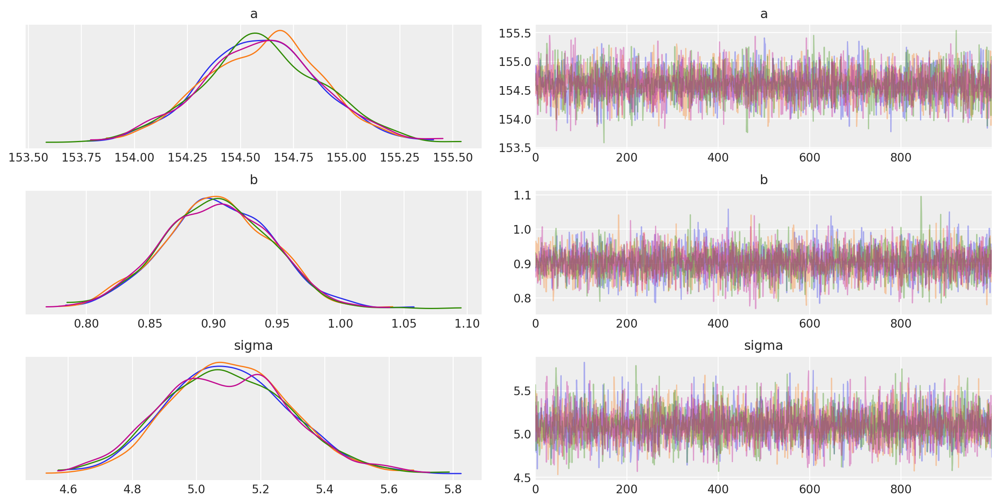

In [95]:
with m4_3:
    az.plot_trace(trace_4_3)

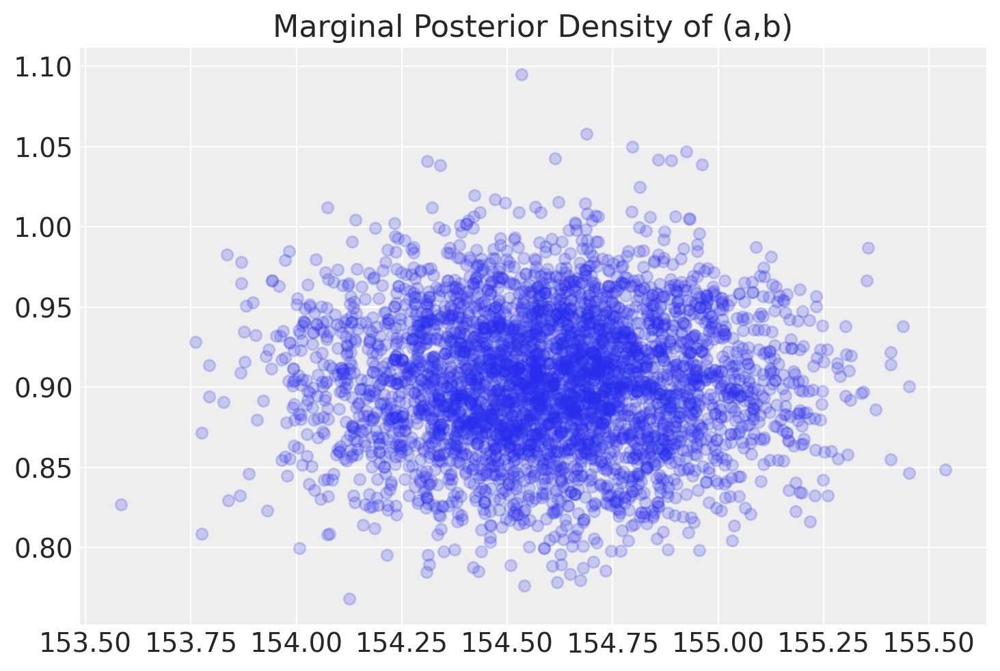

In [99]:
plt.scatter(trace_4_3['a'], trace_4_3['b'], alpha=.2)
plt.title('Marginal Posterior Density of (a,b)');

**Overthinking: Logs and exps.** 

Instead of Log-Normal, we may use Normal for $\beta$

$$
    \log(\beta) \sim N(0,1)
$$

In [102]:
with pm.Model() as m4_3b:
    a = pm.Normal("a", mu=178, sd=20)
    b = pm.Normal("b", mu=0, sd=1)        # log_b ~ Normal(0,1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = a + np.exp(b) * (d2.weight - xbar)  # b = exp(log_b)
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d2.height)
    trace_4_3b = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


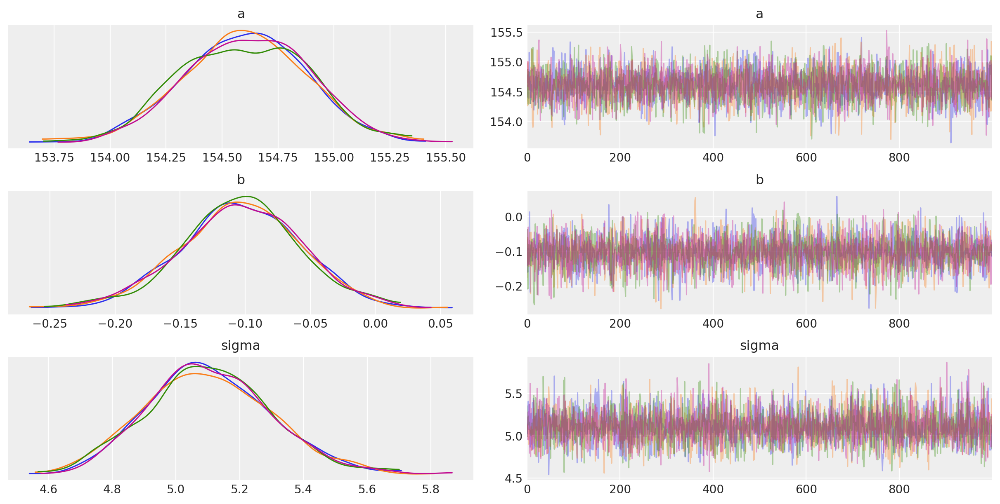

In [104]:
with m4_3b:
    az.plot_trace(trace_4_3b)

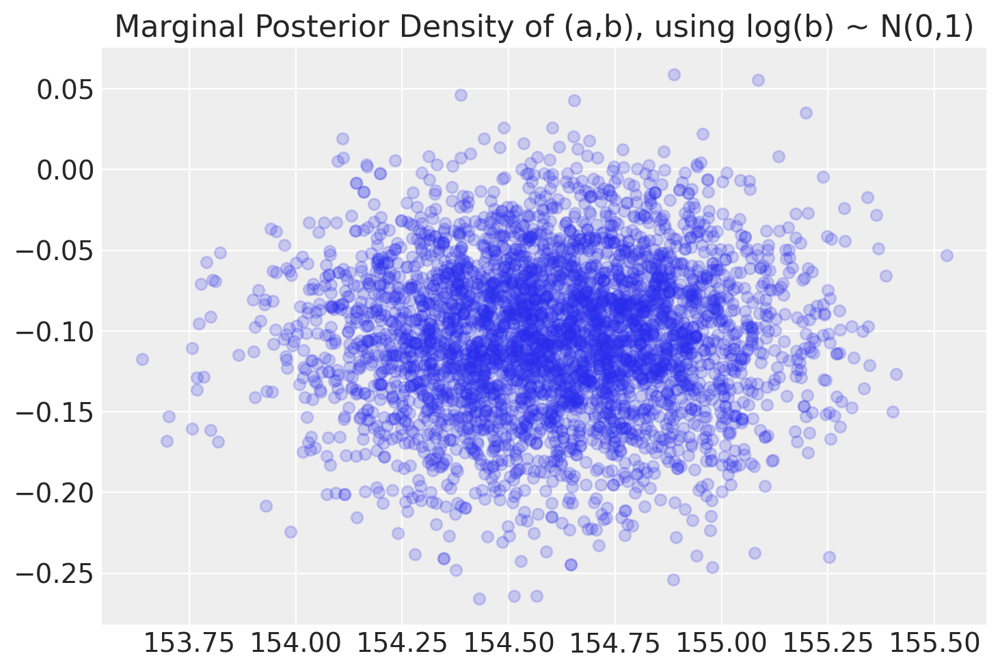

In [105]:
plt.scatter(trace_4_3b['a'], trace_4_3b['b'], alpha=.2)
plt.title('Marginal Posterior Density of (a,b), using log(b) ~ N(0,1)');

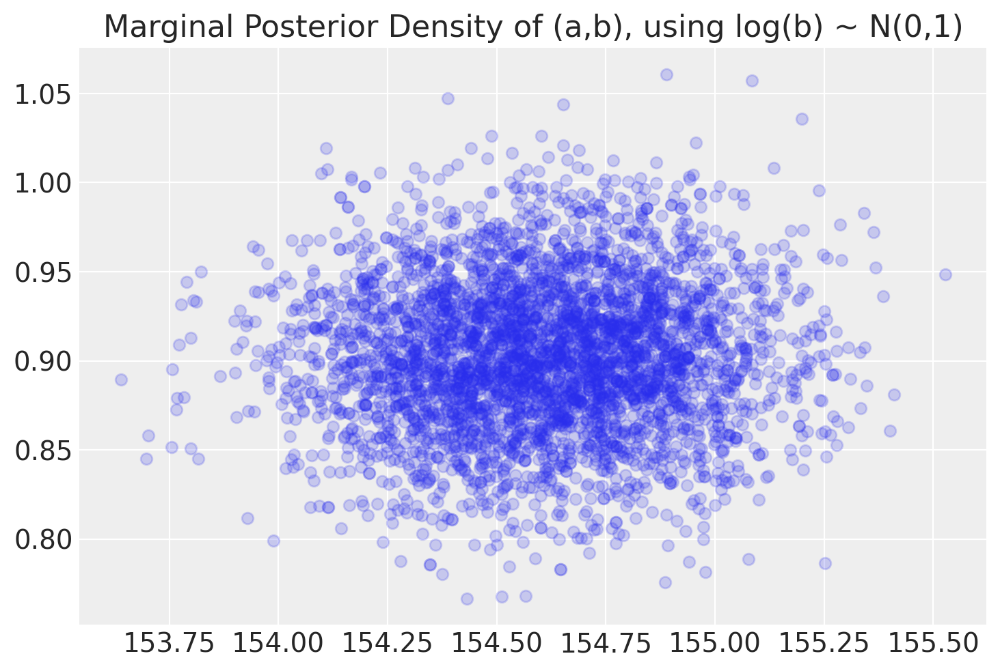

In [107]:
plt.scatter(trace_4_3b['a'], np.exp(trace_4_3b['b']), alpha=.2)
plt.title('Marginal Posterior Density of (a,b), using log(b) ~ N(0,1)');

### 4.4.3. Interpreting the posterior distribution.

#### Code 4.44

In [109]:
with m4_3:
    print( az.summary(trace_4_3, kind="stats") )

          mean     sd  hdi_5.5%  hdi_94.5%
a      154.601  0.274   154.164    155.053
b        0.903  0.042     0.837      0.969
sigma    5.101  0.194     4.791      5.398


- Since $\beta$ is a slope, the value 0.903 can be read as a person 1 kg heavier is expected to be 0.903 cm taller.
- 89% of the posterior probability for $\beta$ lies between $[0.837, 0.969]$, which suggests that $\beat$ values close to 0 or greatly above 1 are highly incompatible with these data and this model.
- It is most certainly **not** evident that the relationship between weight and height is linear, because the model only considered lines.
- If you are committed to a line, then lines with a slope around 0.9 are plausible ones.

#### Code 4.45

In [110]:
trace_4_3_df = pm.trace_to_dataframe(trace_4_3)
trace_4_3_df.cov().round(3)

,a,b,sigma
a,0.075,-0.000,-0.001
b,-0.000,0.002,0.000
sigma,-0.001,0.000,0.037


- Very little covariation among the parameters in this case.

#### 4.4.3.2. Plotting posterior inference against the data.

#### Code 4.46

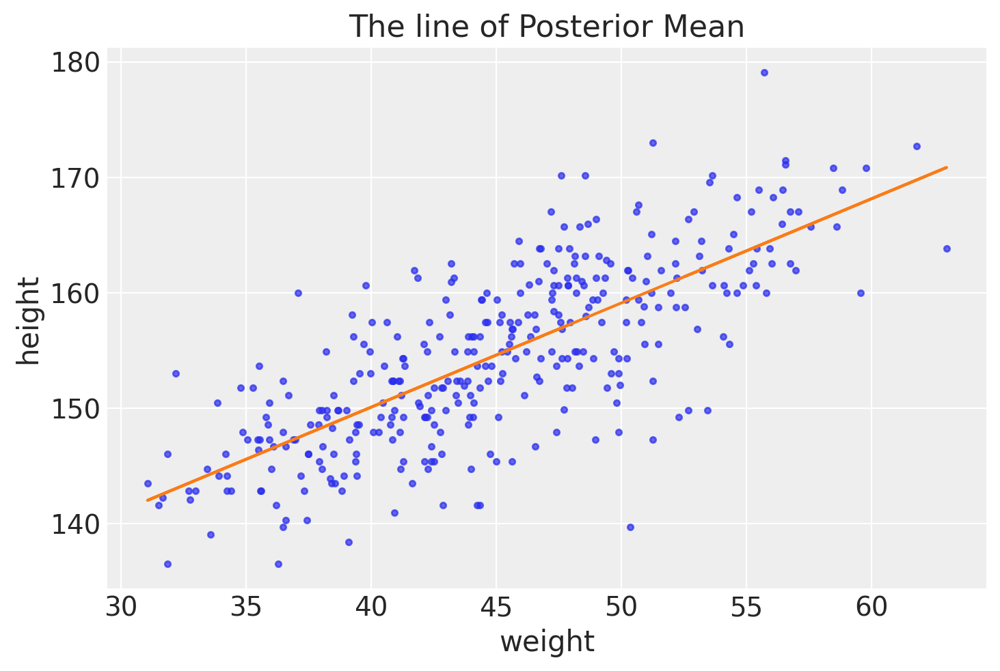

In [123]:
plt.plot(d2.weight, d2.height, ".", alpha=.7)
plt.plot(d2.weight, trace_4_3["a"].mean() + trace_4_3["b"].mean() * (d2.weight - xbar))
plt.title('The line of Posterior Mean')
plt.xlabel(d2.columns[1])
plt.ylabel(d2.columns[0]);

- The line looks highly plausible.
- There are infinite number of other highly plausible lines near it.
- This plot is useful for getting an impression of the magnitude of the estimated influence of a variable (here weight).

#### 4.4.3.3. Adding uncertainty around the mean.
- The posterior distrubtion considers every possible regression line connecting height to weight.
- It assigns a relative plausibility to each.
- That is, each combination of $\alpha$ and $\beta$ has a posterior probability.
- It could be that there are many lines with nearly the same probability as the average line. Or it could be that the posterior is rather narrow near the average line.
- How can we get the uncertainty onto the plot?

#### Code 4.47

In [119]:
# we have a lot of samples from the posterior distribution
trace_4_3_df.head(5)

,a,b,sigma
0,154.674181,0.877896,4.803586
1,154.931520,0.888802,5.365842
2,154.716158,0.889978,4.785112
3,154.467878,0.921768,5.433313
4,154.343850,0.905053,4.597094


#### Code 4.48

- `pm.Deterministic` lets you keep track of a transformed variable. 
- Defining RVs by algebraic transformation works seamlessly as we saw above, but their results are not stored automatically, in `trace` samples for example.

In [137]:
N = [10, 50, 150, 352][0]
dN = d2[:N]
with pm.Model() as m_N:
    a = pm.Normal("a", mu=178, sd=100)
    b = pm.Lognormal("b", mu=0, sd=1)
    sigma = pm.Uniform("sigma", 0, 50)
    mu = pm.Deterministic("mu", a + b * (dN.weight - dN.weight.mean()))
    height = pm.Normal("height", mu=mu, sd=sigma, observed=dN.height)
    trace_N = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


In [138]:
# Due to the usage of mu=pm.Deterministic(), it is kept in the trace.
trace_N.varnames

['a', 'b_log__', 'sigma_interval__', 'b', 'sigma', 'mu']

**PyMC3**
Each row of trace_N['mu'] contains the values of $\mu_i$ for $x_i$ (here $x_i$ is a data from weight)

$$
    \mu_i = \alpha + \beta (x_i - \bar{x})
$$

where ($\alpha$, $\beta$) is a sample from the posterior density.

In [140]:
trace_N['mu'][1], dN['weight'].values

(array([156.31830725, 144.4176842 , 139.56818031, 161.79259385,
        149.44569744, 172.23539057, 146.26228077, 164.3512278 ,
        142.72184542, 163.30992329]),
 array([47.8256065, 36.4858065, 31.864838 , 53.0419145, 41.276872 ,
        62.992589 , 38.2434755, 55.4799715, 34.869885 , 54.487739 ]))

#### Code 4.49

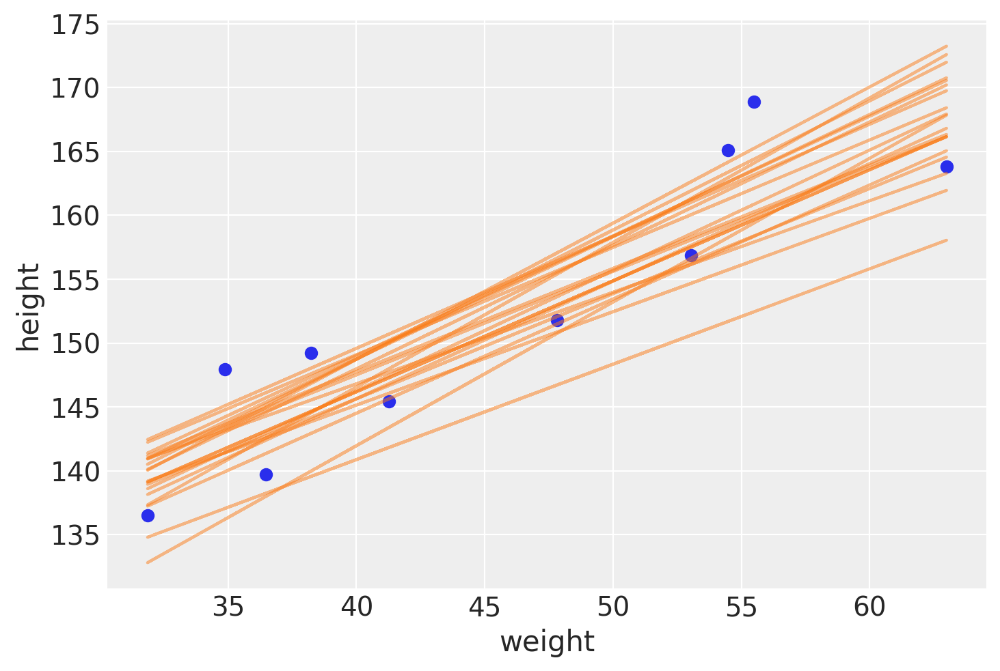

In [124]:
plt.plot(dN.weight, dN.height, "C0o")
idxs = np.random.randint(len(trace_N), size=20)
for idx in idxs:
    plt.plot(
        dN.weight,
        trace_N["a"][idx] + trace_N["b"][idx] * (dN.weight - dN.weight.mean()),
        "C1-",
        alpha=0.5,
    )
plt.xlabel(d2.columns[1])
plt.ylabel(d2.columns[0]);

**Alternatively** we can directly use the deterministic `mu` variable

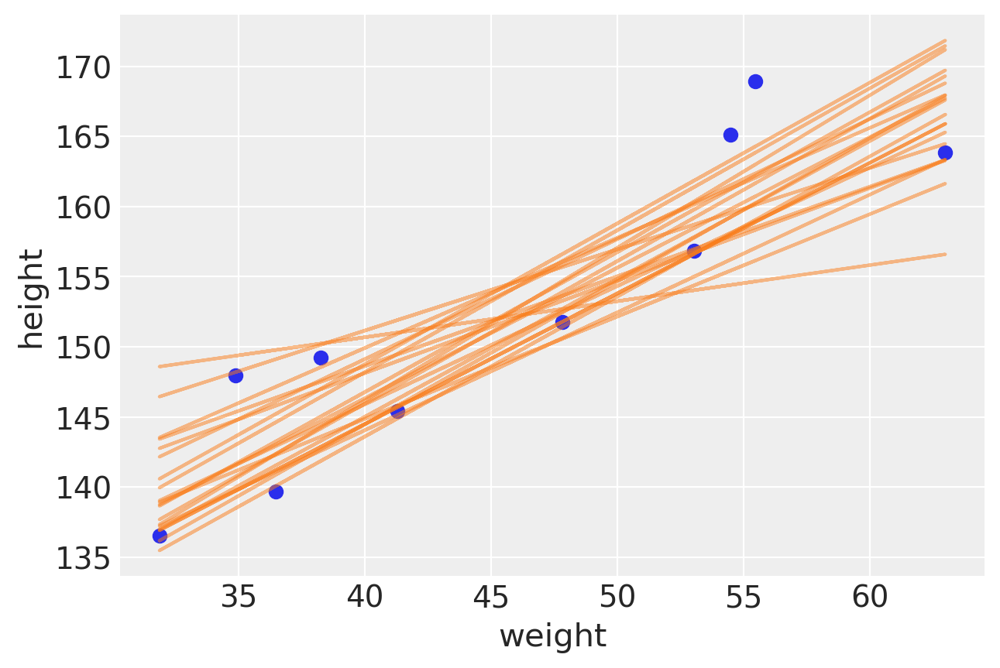

In [50]:
plt.plot(dN.weight, dN.height, "C0o")
for idx in idxs:
    plt.plot(d2.weight[:N], trace_N["mu"][idx], "C1-", alpha=0.5)
plt.xlabel(d2.columns[1])
plt.ylabel(d2.columns[0]);

Repeat for serveral cases.

In [129]:
Nps = [10, 50, 150, 352]
r = []
for N in Nps:
    print(f'PyMC3 learning for {N}')
    dN = d2[:N]
    model, trace = get_trace(dN)
    r.append( (dN, model, trace) )

PyMC3 learning for 10


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


PyMC3 learning for 50


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


PyMC3 learning for 150


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


PyMC3 learning for 352


Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 2 seconds.


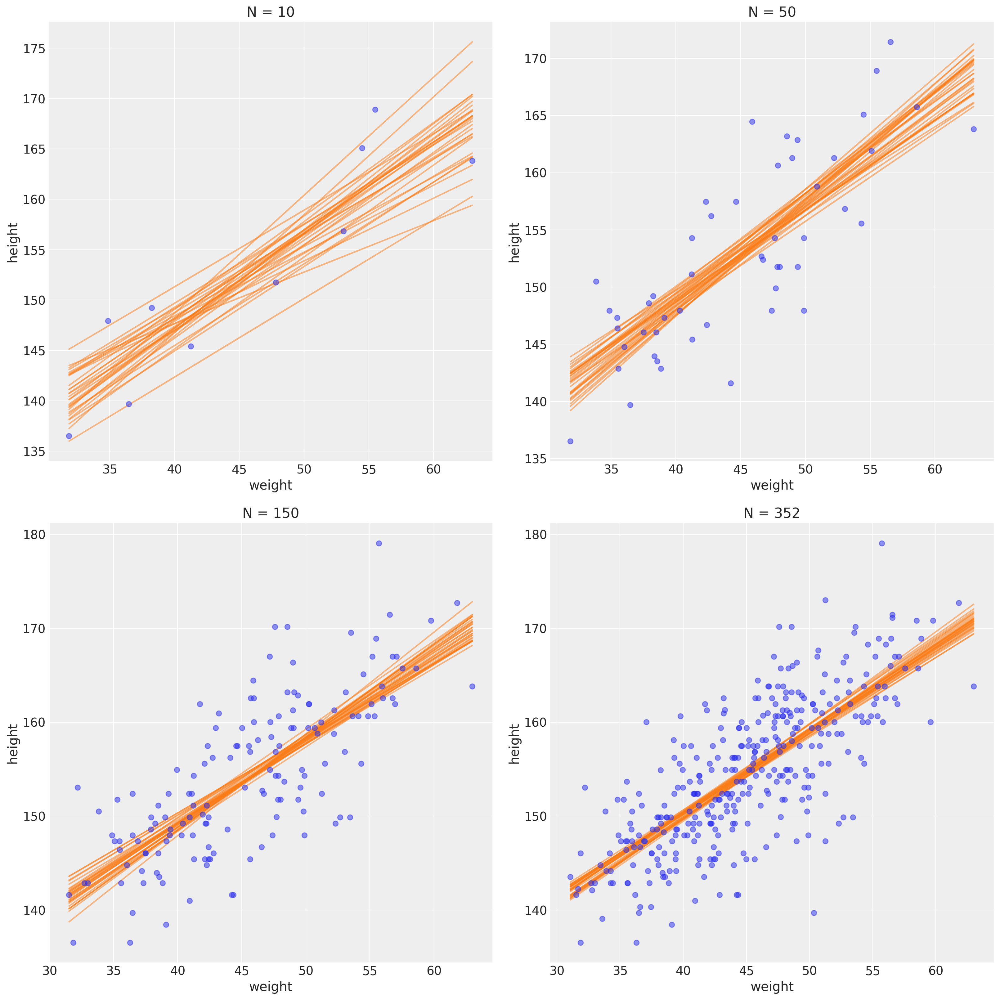

In [134]:
def get_trace(dN):
    """ mu is included in the trace """
    with pm.Model() as model:
        a = pm.Normal("a", mu=178, sd=100)
        b = pm.Lognormal("b", mu=0, sd=1)
        sigma = pm.Uniform("sigma", 0, 50)
        mu = pm.Deterministic("mu", a + b * (dN.weight - dN.weight.mean()))
        height = pm.Normal("height", mu=mu, sd=sigma, observed=dN.height)
        trace_N = pm.sample(1000, tune=1000)
    return model, trace_N
#

def plot_post(dN, model, trace, ax, nlines = 30):
    with model:
        idxs = np.random.randint(len(trace), size=nlines)
        for idx in idxs:
            ax.plot(dN.weight, trace["mu"][idx], "C1-", alpha=0.5)
        ax.set_xlabel(d2.columns[1])
        ax.set_ylabel(d2.columns[0]);
        ax.set_title(f'N = {len(dN)}')
        ax.plot(dN.weight, dN.height, 'o', alpha=.5)
#

fig, axes = plt.subplots(2,2, figsize=(16,16))
for (dN, model, trace), ax in zip(r, axes.ravel()):
    plot_post(dN, model, trace, ax)


**Figure 4.7.** Samples from Posterior Distribution form the height/weight model with increasing amounts of data. 

Focus for the moment on a single weight value, say 50 kilograms. You can quickly make
a list of 10,000 values of µ for an individual who weighs 50 kilograms, by using your samples
from the posterior:

#### Code 4.50

In [164]:
# mu samples for w_i = 50 kg

mu_at_50 = trace_4_3_df["a"] + trace_4_3_df["b"] * (50 - d2.weight.mean())

mu_at_50 = mu_at_50.values # take numpy array only from pandas.Series
print(type(mu_at_50), mu_at_50.shape,'\n', stats.describe(mu_at_50))

<class 'numpy.ndarray'> (4000,) 
 DescribeResult(nobs=4000, minmax=(157.7264662504581, 160.29905951469968), mean=159.12353434771947, variance=0.11935587492955643, skewness=-0.02731563516282526, kurtosis=-0.10076928962557874)


#### Code 4.51

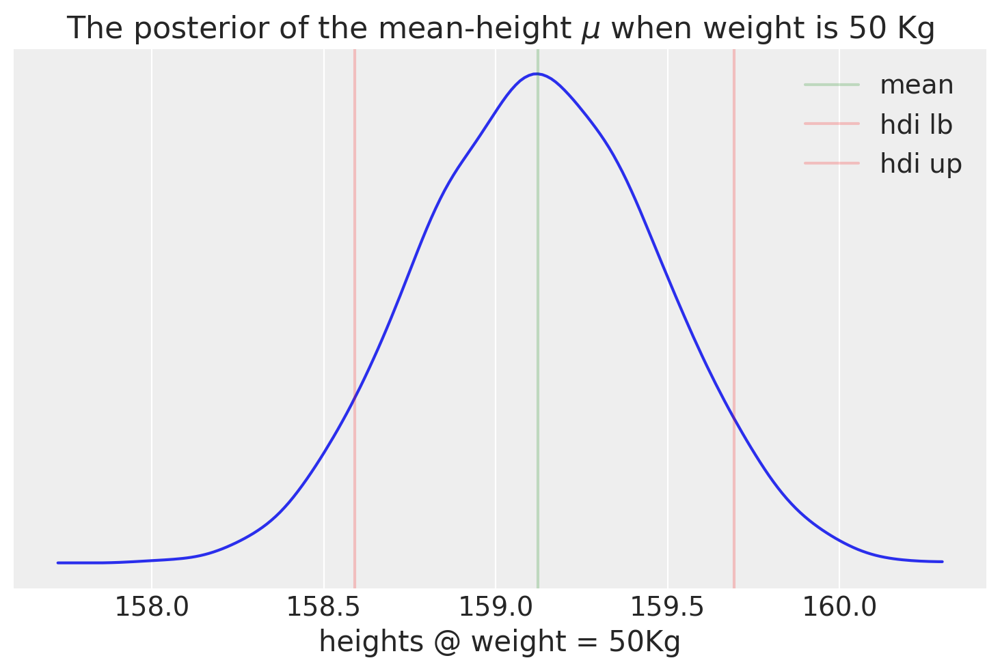

In [214]:
az.plot_kde(mu_at_50, bw=4.)  # the shape depends on bw (bandwidth) parameter for KDE
plt.xlabel("heights @ weight = 50Kg")
plt.title('The posterior of the mean-height $\mu$ when weight is 50 Kg')
plt.axvline(x=mu_at_50.mean(), color='g', alpha=.2, label='mean')
plt.axvline(x=az.hdi(mu_at_50)[0], color='r', alpha=.2, label='hdi lb')
plt.axvline(x=az.hdi(mu_at_50)[1], color='r', alpha=.2, label='hdi up')
plt.legend()
plt.yticks([]);

#### Code 4.52

In [178]:
print(f'HDI:')
az.hdi(mu_at_50, hdi_prob=.89)

HDI:


array([158.59003816, 159.6928694 ])

**Let's do this analysis for every weight values.**

#### Code 4.53 and 4.54

We are doing _manually_, in the book is done using the ```link``` function. In the book on code 4.58 the following operations are performed _manually_.

In [203]:
weight_seq = np.linspace(30, 65, 100)
print(f'We consider {len(weight_seq)} weight locations.')

# Given that we have a lot of samples we can use less of them for plotting (or we can use all!)
trace_4_3_thinned = trace_4_3[::20]
print(f'We use {len(trace_4_3_thinned)} posterior samples only among {len(trace_4_3)}')

n_mu_per_weight = len(trace_4_3_thinned) * trace_4_3.nchains 
print(f'So we will produce {n_mu_per_weight} samples per a weight value')

mu_pred = np.zeros((len(weight_seq), n_mu_per_weight))
print(f'> mu_pred has shape {mu_pred.shape}')

# generate mu samples for each of the weight value
for i, w in enumerate(weight_seq):
    mu_pred[i] = trace_4_3_thinned["a"] + trace_4_3_thinned["b"] * (w - d2.weight.mean())

We consider 100 weight locations.
We use 50 posterior samples only among 1000
So we will produce 200 samples per a weight value
> mu_pred has shape (100, 200)


#### Code 4.55

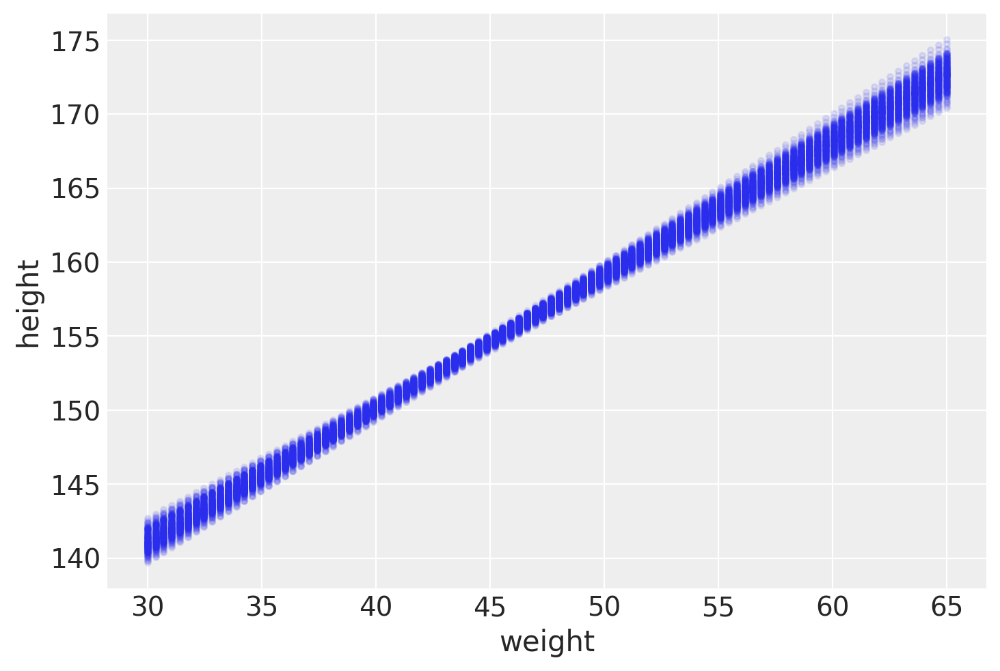

In [204]:
plt.plot(weight_seq, mu_pred, "C0.", alpha=0.1)
plt.xlabel("weight")
plt.ylabel("height");

#### Code 4.56

In [207]:
mu_mean = mu_pred.mean(1); print(mu_mean.shape)
mu_hdi = az.hdi(mu_pred.T); print(mu_hdi.shape)

w = 30 # Kg
print(mu_mean[w], mu_hdi[w])

(100,)
(100, 2)
150.66580861553982 [150.25067887 151.12232502]


/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,


In [208]:
mu_pred.shape, az.hdi(mu_pred).shape  # we must do Transpose!

((100, 200), (200, 2))

#### Code 4.57

/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,
/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,


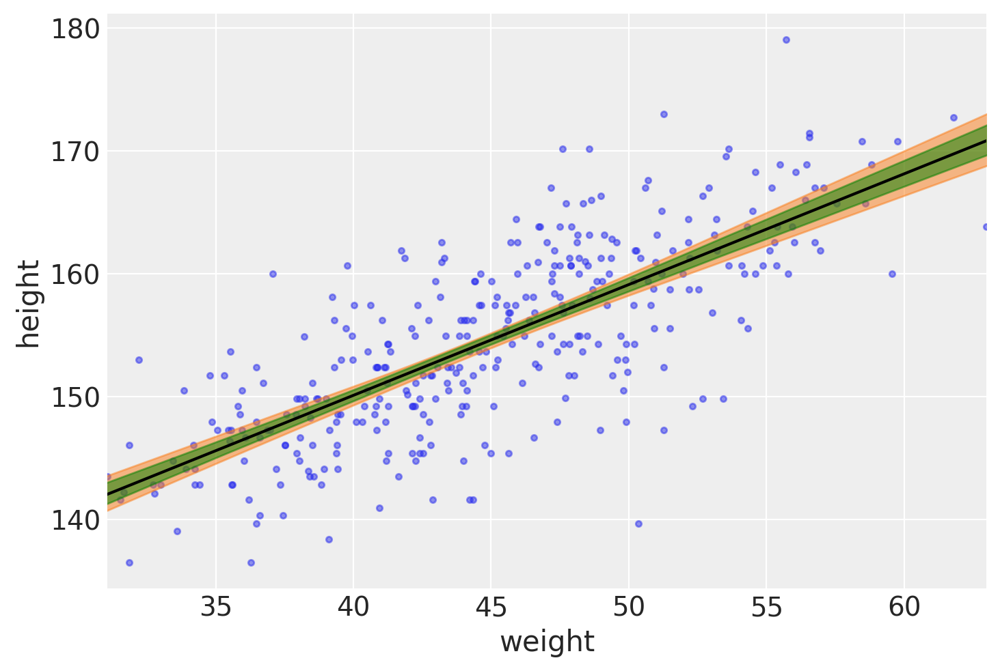

In [213]:
plt.scatter(d2.weight, d2.height, marker='.', alpha=.5)
plt.plot(weight_seq, mu_mean, "k")
az.plot_hdi(weight_seq, mu_pred.T, ax=plt.gca(), hdi_prob=0.999)
az.plot_hdi(weight_seq, mu_pred.T, ax=plt.gca(), hdi_prob=0.89, color='g')
plt.xlabel("weight")
plt.ylabel("height")
plt.xlim(d2.weight.min(), d2.weight.max());

#### 4.4.3.5. Prediction intervals.

Up to now, we examined the distribution of $\mu$, the mean value of the observation model.

$$
    \begin{align}
        h_i    & \sim N(\mu_i, \sigma) \quad\quad\quad \mbox{ likelihood }\\
        \mu_i  & = \alpha + \beta (x_i - \bar{x})   \quad\quad \mbox{ linear model }\big( \mu \sim N(178,20) \quad\mbox{previously}\big)\\
        \alpha & \sim N(178, 20) \\
        \beta  & \sim N(0,10) \\
        \sigma & \sim U(0,50)
    \end{align}
$$

From now on, we walk through generating an 89% prediction interval for actual heights, not just the average height, $\mu$.
- We will incorporate the standard deviation $\sigma$ and its uncertainty as well.

$$
      h_i    \sim N(\mu_i, \sigma)
$$

- This Gaussian distribution tells us that the model expects observed heights to be distributed around $\mu$, not right on top of it.
- The spread around $\mu$ is governed by $\sigma$.

In [217]:
print(f'Our data d2 has {d2.shape[0]} elements.')

Our data d2 has 352 elements.


#### Code 4.59

**PyMC3** Now we are going to use ```sample_posterior_predictive()``` from PyCM3. This function gives us posterior predictive samples, that is for each value of the input variable we get a sample (from the posterior) of the output variable. Thus in the following example the shape of `height_pred['height'].shape is (200, 352)`

In [229]:
height_pred = pm.sample_posterior_predictive(trace_4_3, 200, m4_3)

In [235]:
trace_4_3.varnames, type(height_pred), height_pred.keys(), type(height_pred['height']), height_pred['height'].shape

(['a', 'b_log__', 'sigma_interval__', 'b', 'sigma'],
 dict,
 dict_keys(['height']),
 numpy.ndarray,
 (200, 352))

#### Code 4.60

In [234]:
height_pred_hpd = az.hdi(height_pred["height"])
print(height_pred_hpd.shape)

(352, 2)


In [237]:
height_pred['height'].shape, mu_pred.shape

((200, 352), (100, 200))

#### Code 4.61

/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,
/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,
No handles with labels found to put in legend.


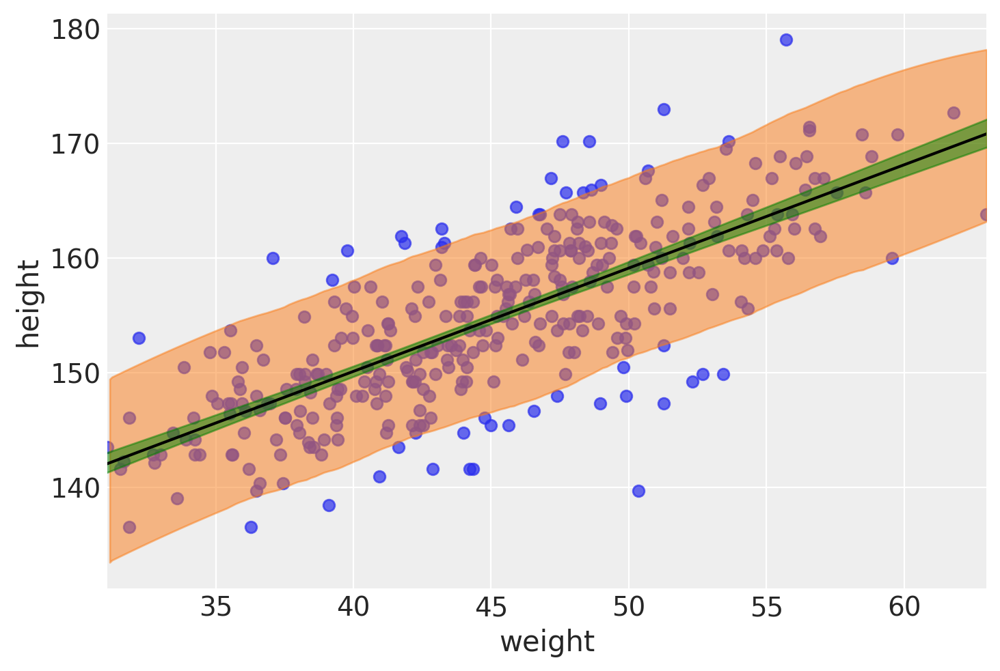

In [248]:
plt.scatter(d2.weight, d2.height, alpha=.7, marker='o')
ax = plt.gca()
az.plot_hdi(d2.weight, height_pred["height"], ax=ax)  # posterior sample (h) prediction density
az.plot_hdi(weight_seq, mu_pred.T, ax=ax, color='green') # mu posterior density
plt.plot(weight_seq, mu_mean, "k")    # mean of mu, posterior mean
plt.xlabel("weight")
plt.ylabel("height")
plt.legend()
plt.xlim(d2.weight.min(), d2.weight.max());

**Figure 4.10.** 89% prediction interval for
height, as a function of weight. The solid line
is the average line for the mean height at each
weight. The two shaded regions show different
89% plausible regions. The narrow shaded interval around the line is the distribution of µ.
The wider shaded region represents the region
within which the model expects to find 89%
of actual heights in the population, at each
weight.

#### Code 4.62

Change the number of samples used in 4.59 (200) to other values.

#### Code 4.63

**Rolling** Now we are going to generate heights from the posterior *manually*. Instead of restricting ourselves to the input values, we are going to pass an array of equally spaced weights values, called `weight_seg`.

In [251]:
weight_seq = np.arange(25, 71)
weight_seq = np.linspace(30, 65, 100)
post_samples = []
for _ in range(1000):  # number of samples from the posterior
    i = np.random.randint(len(trace_4_3))
    mu_pr = trace_4_3["a"][i] + trace_4_3["b"][i] * (weight_seq - d2.weight.mean())
    sigma_pred = trace_4_3["sigma"][i]
    post_samples.append(np.random.normal(mu_pr, sigma_pred))

In [256]:
len(post_samples), post_samples[0].shape  # each sample has 

(1000, (100,))

In [263]:
post_samples = np.array(post_samples)

weight_seq.shape, post_samples.shape, mu_pred.shape, weight_seq[40]

((100,), (1000, 100), (100, 200), 44.141414141414145)

**Posterior Height Distribution @ weight=44.14Kg**

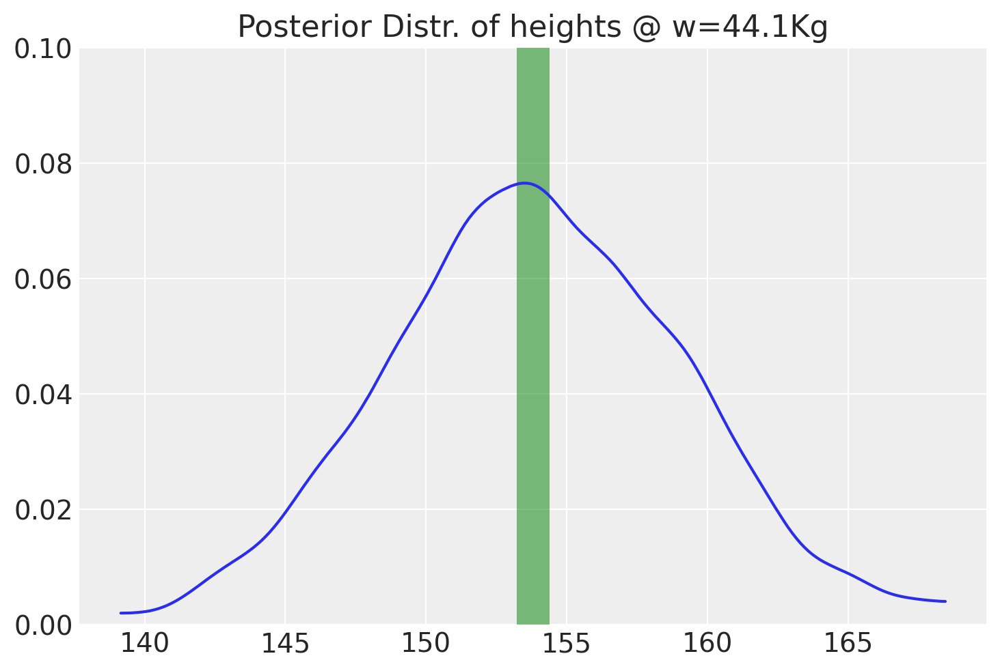

In [284]:
idx = 40
w = weight_seq[idx]
height_samples_at_w = post_samples[:, idx]
mu_samples_at_w = mu_pred[idx]

fig, ax=plt.subplots(1)
az.plot_kde(height_samples_at_w, bw=4., ax=ax)
# az.plot_kde(mu_samples_at_w, bw=1., ax=ax)
ax.hist(mu_samples_at_w, density=True, color='g', alpha=.5);
ax.set_title(f'Posterior Distr. of heights @ w={w:.3}Kg')
ax.set_ylim([0, 0.1]);

**Posterior Height Distribution along Weight Values**

/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,
/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,


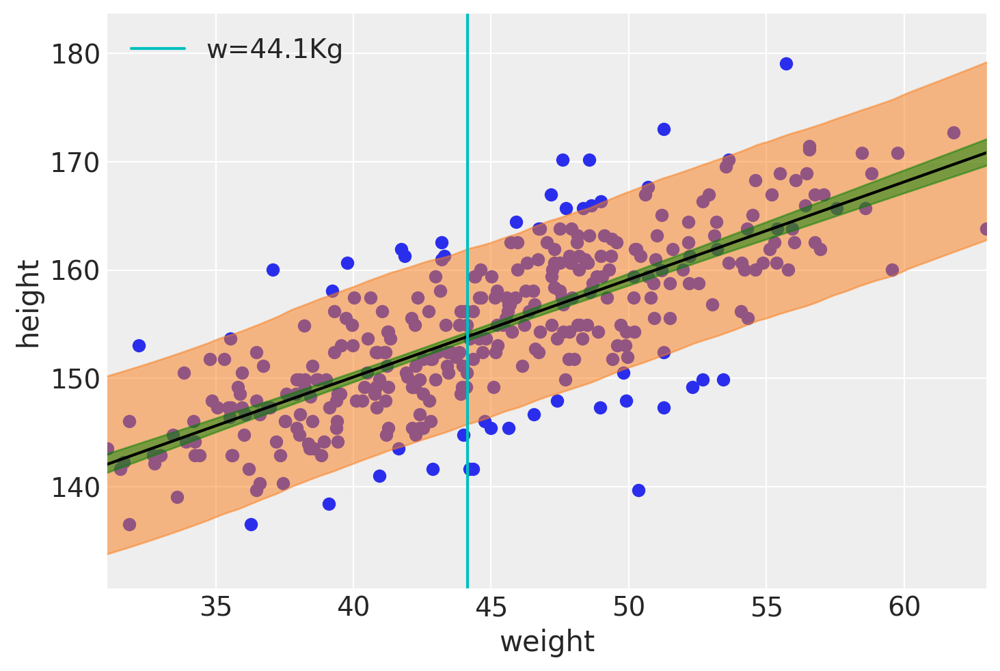

In [269]:
plt.scatter(d2.weight, d2.height)
ax=plt.gca()

az.plot_hpd(weight_seq, post_samples, ax=ax);

plt.plot(weight_seq, mu_mean, "k")
az.plot_hpd(weight_seq, mu_pred.T, ax=ax, color='green');
plt.xlabel("weight")
plt.ylabel("height")
plt.axvline(x=w, color='c', label=f'w={w:.3}Kg')
plt.legend()
plt.xlim(d2.weight.min(), d2.weight.max());

## 4.5. Curves from lines

- There is nothing special about straight lines aside from their simplicity.
- Curves instead of lines.
    - Polynomial regression
    - B-Splines

### 4.5.1. Polynomial regression.

1. parabolic or quadratic

$$
    h_i = \alpha + \beta_1 x_i + \beta_2 x_i^2
$$

2. cubic

$$
    h_i = \alpha + \beta_1 x_i + \beta_2 x_i^2 + \beta_3 x_i^3
$$

- Fitting these models to data is easy.
- Interpreting them can be hard.

#### Code 4.64

We have already loaded this dataset, check code 4.7 and 4.8.

In [286]:
d = pd.read_csv("Data/Howell1.csv", sep=";", header=0)
d.head()

,height,weight,age,male
0,151.765,47.825606,63.0,1
1,139.700,36.485807,63.0,0
2,136.525,31.864838,65.0,0
3,156.845,53.041915,41.0,1
4,145.415,41.276872,51.0,0


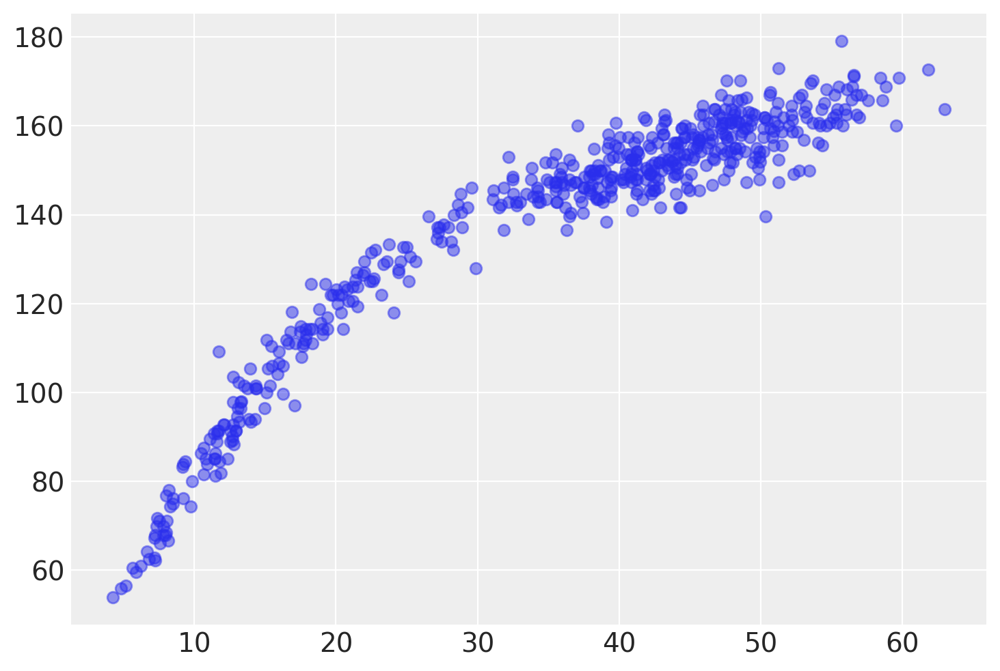

In [290]:
plt.plot(d['weight'], d.height, 'o', alpha=.5);

In [291]:
d.describe()

,height,weight,age,male
count,544.000000,544.000000,544.000000,544.000000
mean,138.263596,35.610618,29.344393,0.472426
std,27.602448,14.719178,20.746888,0.499699
min,53.975000,4.252425,0.000000,0.000000
25%,125.095000,22.007717,12.000000,0.000000
50%,148.590000,40.057844,27.000000,0.000000
75%,157.480000,47.209005,43.000000,1.000000
max,179.070000,62.992589,88.000000,1.000000


**Standardize** the predictor variable:

$$
    x_i \leftarrow \frac{x_i - \bar{x}}{\mathrm{std}(x)}
$$
- When predictor variables have large values in them, numerical glitches during the computation may occur, and cause mistaken estimates.
- This should be your default behavior for data computation!

In [294]:
d["weight_std"] = (d.weight - d.weight.mean()) / d.weight.std()
d["weight_std2"] = d.weight_std ** 2

d.keys()

Index(['height', 'weight', 'age', 'male', 'weight_std', 'weight_std2'], dtype='object')

**Prior for $\beta_2$**
- confusing
- it needs not be non-negative, unlike $\beta_1$.
- in general, very difficult to set a realistic priors for it.
- One of the reasons to avoid polynomial models.

#### Code 4.65

In [295]:
with pm.Model() as m_4_5:
    # priors
    a = pm.Normal("a", mu=178, sd=100)
    b1 = pm.Lognormal("b1", mu=0, sd=1)
    b2 = pm.Normal("b2", mu=0, sd=1)
    sigma = pm.Uniform("sigma", lower=0, upper=50)

    # polynomial model for mu. Standardaized preditor variable is used!
    mu = pm.Deterministic("mu", a + b1 * d.weight_std + b2 * d.weight_std2)
    
    # likelihood model
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d.height)  
    
    # generate posterior samples for the parameters (a, b1, b2, sigma, mu)
    trace_4_5 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b2, b1, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


In [296]:
trace_4_5.varnames

['a', 'b1_log__', 'b2', 'sigma_interval__', 'b1', 'sigma', 'mu']

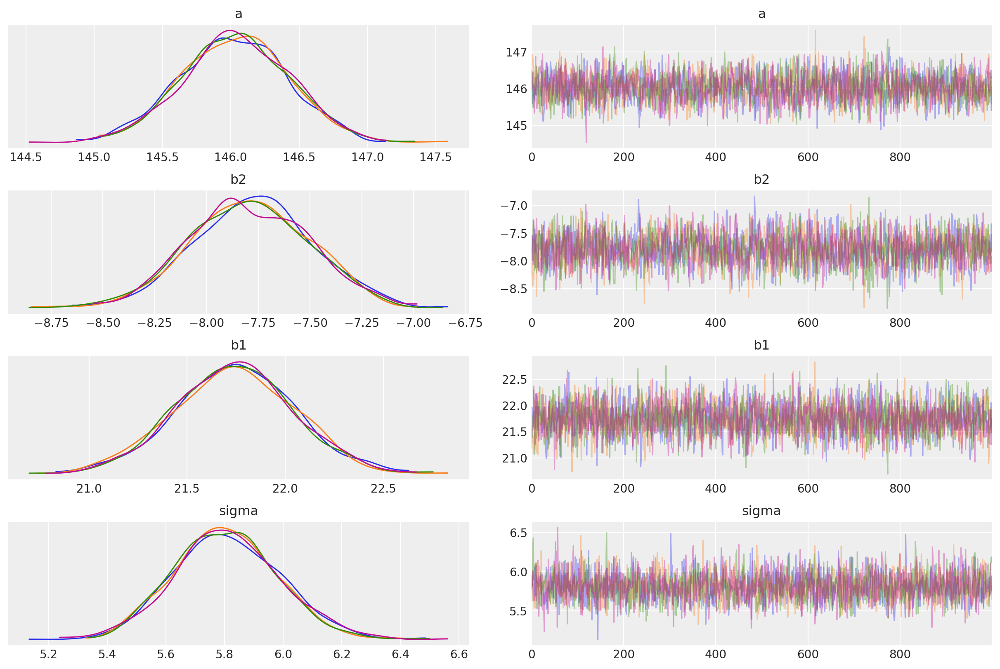

In [298]:
varnames = ["~mu"]  # except for this
with m_4_5:
    az.plot_trace(trace_4_5, varnames);

#### Code 4.66

In [300]:
with m_4_5:
    print( az.summary(trace_4_5, varnames, kind="stats", round_to=2) )

         mean    sd  hdi_5.5%  hdi_94.5%
a      146.03  0.38    145.43     146.65
b2      -7.79  0.28     -8.23      -7.33
b1      21.74  0.30     21.28      22.23
sigma    5.81  0.18      5.51       6.07


#### Code 4.67

In [306]:
mu_pred = trace_4_5["mu"]
print('mu_pred:', mu_pred.shape)

mu_mean = mu_pred.mean(axis=0)
print('mu_mean:', mu_mean.shape)

height_pred = pm.sample_posterior_predictive(trace_4_5, 200, m_4_5)

mu_pred: (4000, 544)
mu_mean: (544,)


#### Code 4.68

/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,
/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,


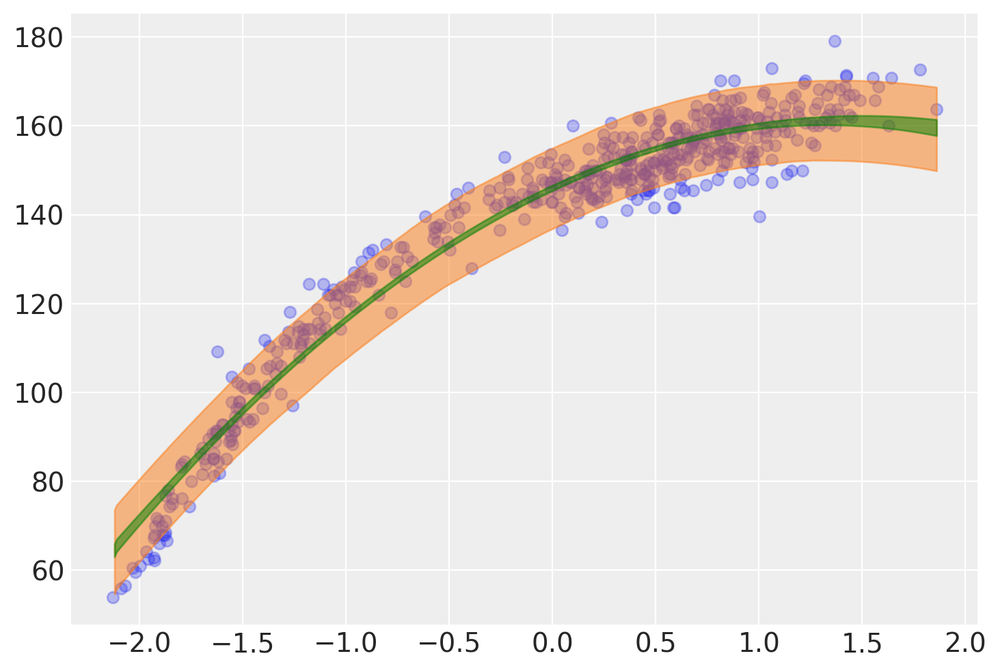

In [310]:
plt.scatter(d.weight_std, d.height, c="C0", alpha=0.3)
ax=plt.gca()
az.plot_hpd(d.weight_std, height_pred["height"], ax=ax);
az.plot_hpd(d.weight_std, mu_pred, ax=ax, color='g');

**Cubic Regression**

#### Code 4.69

We will stack the weights to get a 2D array, these simplifies wrriting a model. Now we can compute the dot product between beta and the 2D-array

In [311]:
weight_m = np.vstack((d.weight_std, d.weight_std ** 2, d.weight_std ** 3))

In [312]:
with pm.Model() as m_4_6:
    a = pm.Normal("a", mu=178, sd=100)
    b = pm.Normal("b", mu=0, sd=10, shape=3)
    sigma = pm.Uniform("sigma", lower=0, upper=50)
    mu = pm.Deterministic("mu", a + pm.math.dot(b, weight_m))
    height = pm.Normal("height", mu=mu, sd=sigma, observed=d.height)
    trace_4_6 = pm.sample(1000, tune=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [sigma, b, a]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 4 seconds.


#### Code 4.70 and 4.71

/home/yndk/.local/lib/python3.6/site-packages/pymc3/sampling.py:1618: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  "samples parameter is smaller than nchains times ndraws, some draws "


/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,
/home/yndk/.local/lib/python3.6/site-packages/arviz/stats/stats.py:486: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  FutureWarning,


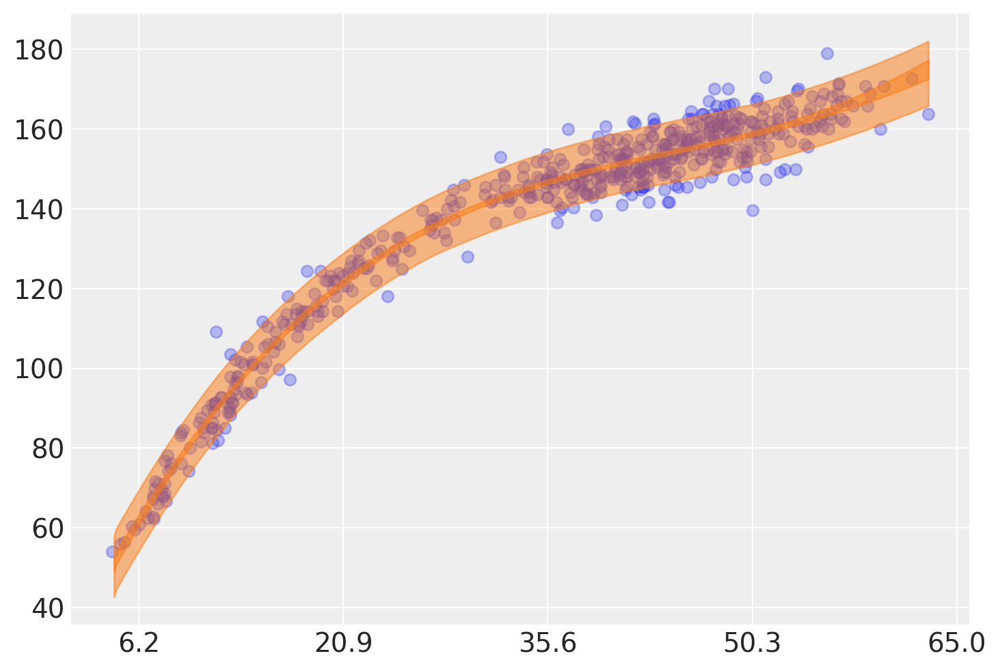

In [314]:
mu_pred = trace_4_6["mu"]
height_pred = pm.sample_posterior_predictive(trace_4_6, 200, m_4_6)

plt.scatter(d.weight_std, d.height, c="C0", alpha=0.3)
ax = plt.gca()
az.plot_hpd(d.weight_std, mu_pred, ax=ax)
az.plot_hpd(d.weight_std, height_pred["height"], ax=ax)

at = np.arange(-2, 3)
plt.xticks(at, np.round(at * d.weight.std() + d.weight.mean(), 1));

### 4.5.2. Spline Fitting

#### Code 4.72

In [72]:
d = pd.read_csv("Data/cherry_blossoms.csv")
# nans are not treated as in the book
az.summary(d.dropna().to_dict(orient="list"), kind="stats")

,mean,sd,hpd_5.5%,hpd_94.5%
year,1533.395,291.123,1123.00,1978.00
doy,104.921,6.258,95.00,114.00
temp,6.100,0.683,5.00,7.13
temp_upper,6.938,0.812,5.57,7.98
temp_lower,5.264,0.762,4.12,6.40


#### Code 4.73

In [73]:
d2 = d.dropna(subset=["doy"])
num_knots = 15
knot_list = np.quantile(d2.year, np.linspace(0, 1, num_knots))

#### Code 4.74

Here we will use patsy as a simple way of building the b-spline matrix. For more detail please read https://patsy.readthedocs.io/en/latest/spline-regression.html

In [74]:
from patsy import dmatrix

B = dmatrix(
    "bs(year, knots=knots, degree=3, include_intercept=True) - 1",
    {"year": d2.year.values, "knots": knot_list[1:-1]},
)

#### Code 4.75

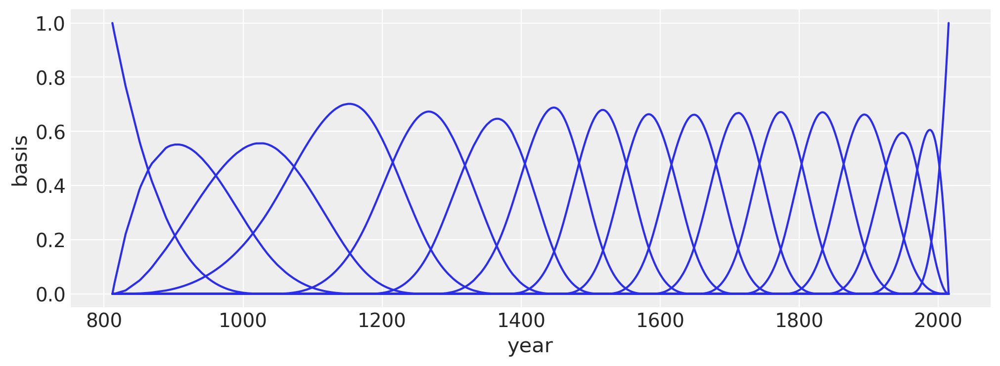

In [75]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
for i in range(17):
    ax.plot(d2.year, (B[:, i]), color="C0")
ax.set_xlabel("year")
ax.set_ylabel("basis");

#### Code 4.76

Note: if the mode gets stall instead of sampling try replacing `mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))` with `mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T))`

In [77]:
with pm.Model() as m4_7:
    a = pm.Normal("a", 100, 10)
    w = pm.Normal("w", mu=0, sd=10, shape=B.shape[1])
    mu = pm.Deterministic("mu", a + pm.math.dot(np.asarray(B, order="F"), w.T))
    # mu = pm.Deterministic("mu", a + pm.math.dot(B.base, w.T))
    sigma = pm.Exponential("sigma", 1)
    D = pm.Normal("D", mu, sigma, observed=d2.doy)
    trace_m4_7 = pm.sample(1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [sigma, w, a]


The acceptance probability does not match the target. It is 0.8791318633887154, but should be close to 0.8. Try to increase the number of tuning steps.
The number of effective samples is smaller than 25% for some parameters.


#### Code 4.77

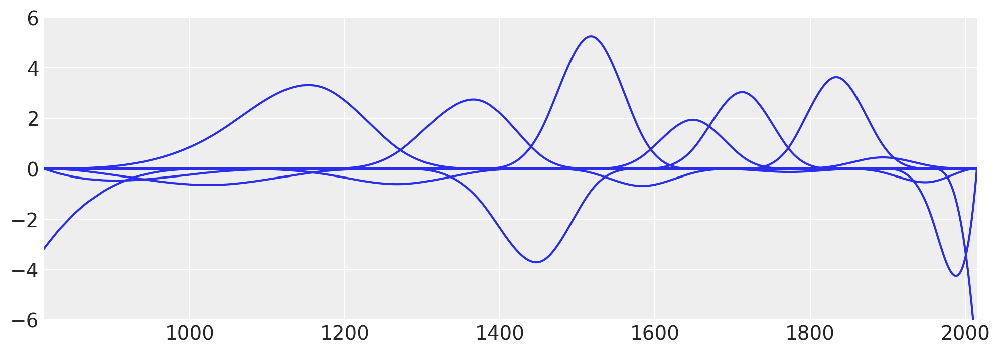

In [78]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))
wp = trace_m4_7[w].mean(0)
for i in range(17):
    ax.plot(d2.year, (wp[i] * B[:, i]), color="C0")
ax.set_xlim(812, 2015)
ax.set_ylim(-6, 6);

#### Code 4.78

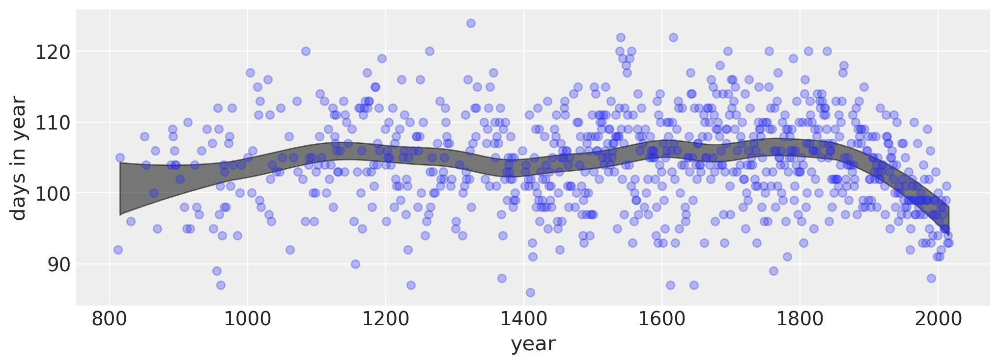

In [79]:
_, ax = plt.subplots(1, 1, figsize=(12, 4))

ax.plot(d2.year, d2.doy, "o", alpha=0.3)
az.plot_hpd(d2.year, trace_m4_7["mu"], color="k")
ax.set_xlabel("year")
ax.set_ylabel("days in year");

In [80]:
%watermark -n -u -v -iv -w

pymc3    3.8
numpy    1.18.1
arviz    0.6.1
autopep8 1.5
json     2.0.9
pandas   1.0.1
last updated: Mon Feb 24 2020 

CPython 3.7.6
IPython 7.12.0
watermark 2.0.2
